# CT noisy sinogram reconstruction

The goal of this project is to build a deep learning model which is able to recostruct clean, high-dose & high quality images from low-dose (noisy) CT sinograms.

Why is this beneficial?

A full body CT scan with the traditional dose and traditional reconstruction method ( https://www.youtube.com/watch?v=pZ7JlXagT0w ) is equivalent to around 100-300 chest X-rays in terms of radiation dose absorbed by the body. Lowering the dose of each scan can result in significantly less absorbed radiation which reduces the chance of potential adverse effects of CT. Lowering the dose on the other hand results in highly noisy, decreased quality images which have significantly less diagnostic value if reconstructed with the traditional reconstruction methods.

Modern deep learning networks however have the capacity to restore high quality images from low-dose CT scans, resulting in equivalent diagnostic quality images as high-dose CT scans,effectively reducing the harmul potential of the technology.

For this, you need to train the network on low-dose noisy sinogram / high quality high dose image pairs.

I'm using the following dataset: https://zenodo.org/records/3384092 and I'm trying to implement a reconstruction method with the help of tensorflow

In this notebook I'm trying to enchance the vision transformer with Fourier Feature Mapping found in this video: https://www.youtube.com/watch?v=h0SXP6lJxak

Fourier Features can enchance high frequency components in coordinate-based MLP-s. I wonder if they can do the same with my blurry vision transformer.

## Part 1: Exploratory Data Analysis

In [1]:
import numpy as np

In [2]:
from skimage.transform import radon, iradon, rotate

In [3]:
print(np.__version__)

1.26.4


Unfortunately, tensorflow was not working on windows with my GPU, so I had to set up WSL for it to work. The files are too large to be copied to C, this is why I'm referring them on /mnt/d always

In [4]:
from pathlib import Path
base_path_win = Path('/mnt/d/Masters/Medical_Imaging')

#### first take a look at the ground truth dataset:

In [5]:
import h5py
gtval_path = Path(base_path_win,'gt_train/ground_truth_train_000.hdf5')
file_gt = h5py.File(gtval_path)
print(file_gt.keys())

<KeysViewHDF5 ['data']>


In [6]:
dataset = file_gt['data']
print(dataset.shape)

(128, 362, 362)


[  8.  16.  24.  32.  40.  48.  56.  64.  72.  80.  88.  96. 104. 112.
 120. 128.]
[[  8.  16.  24.  32.]
 [ 40.  48.  56.  64.]
 [ 72.  80.  88.  96.]
 [104. 112. 120. 128.]]


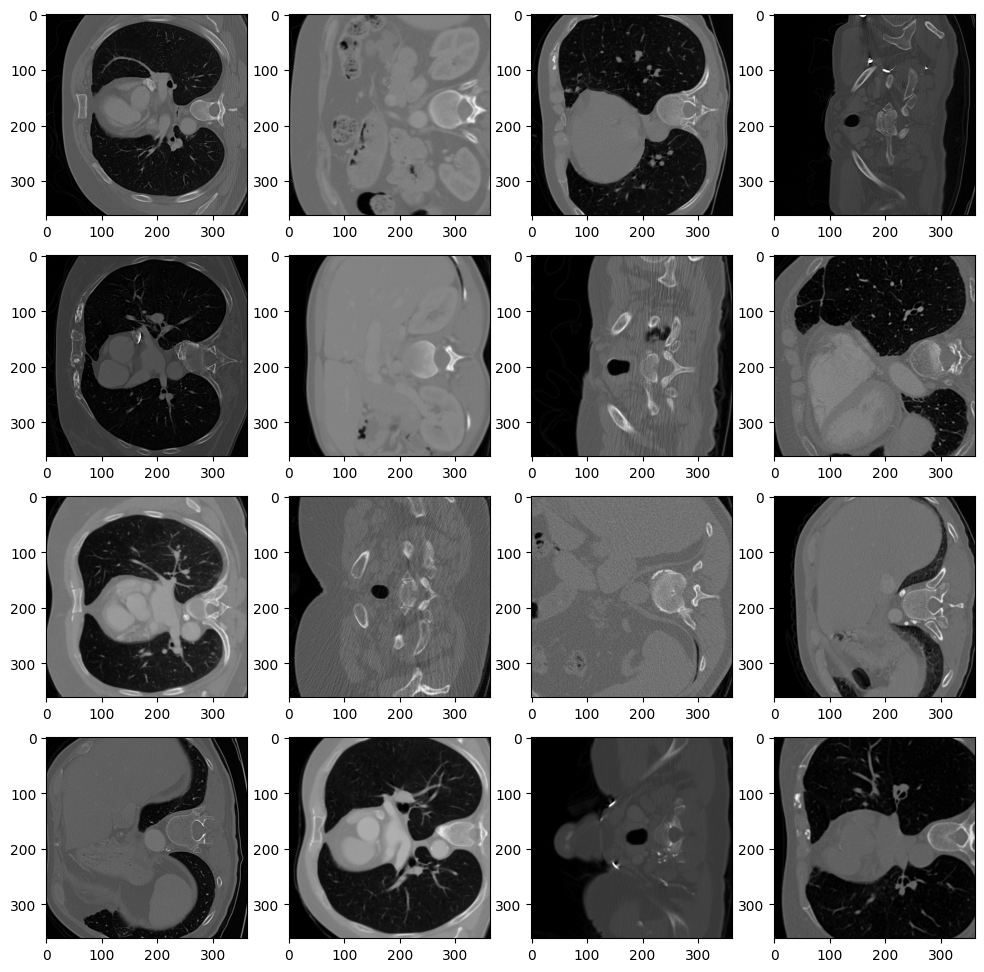

In [7]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(4, 4, figsize = (12, 12))
tocheck = np.linspace(8, 128, 16)
plotarray = np.reshape(tocheck, [4,4])
print(tocheck)
len(tocheck)
print(plotarray)
for i in range(4):
    for j in range(4):
        axs[i, j].imshow(dataset[int(plotarray[i][j])-1][:][:], cmap = 'grey')




In [8]:
file_obs = h5py.File(Path(base_path_win, 'observations_train/observation_train_000.hdf5'))
print(file_obs.keys())

<KeysViewHDF5 ['data']>


In [9]:
dataset_obs = file_obs['data']
print(dataset_obs.shape)

(128, 1000, 513)


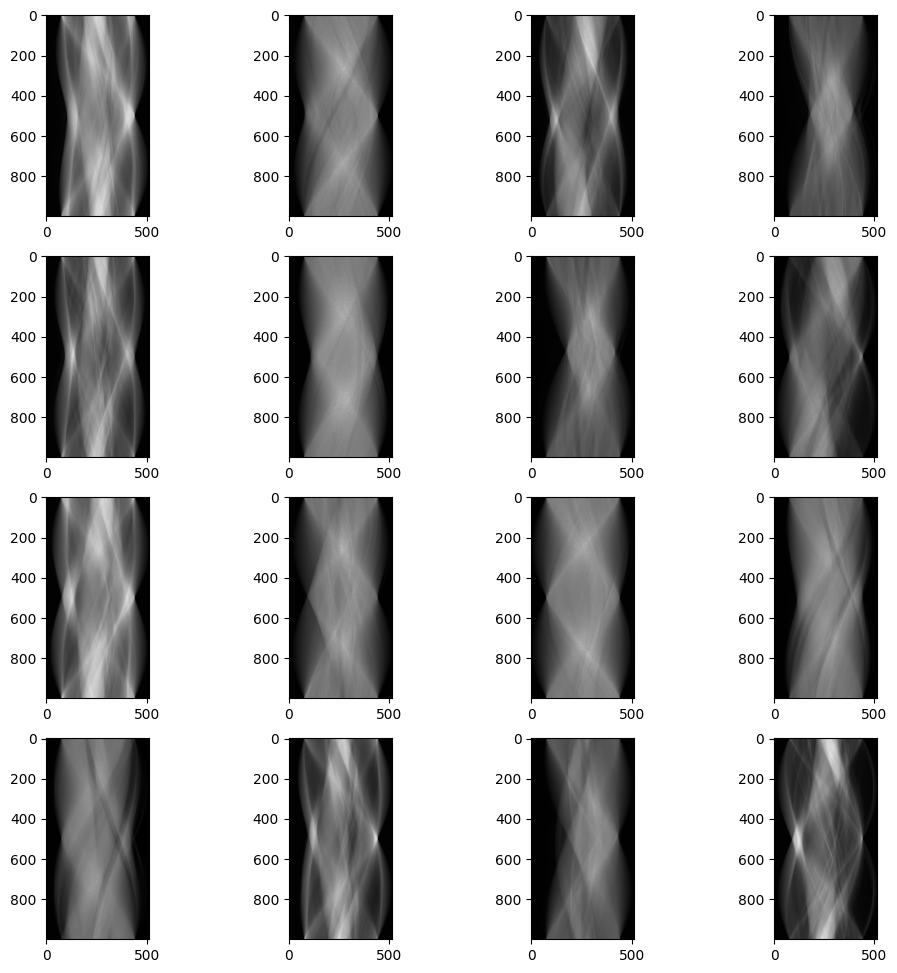

In [10]:
fig, axs = plt.subplots(4, 4, figsize = (12, 12))

for i in range(4):
    for j in range(4):
        axs[i, j].imshow(dataset_obs[int(plotarray[i][j])-1][:][:], cmap = 'grey')

### Conclusion: the ground truth contains the high quality restored images, the observations contain the noisy sinogram. 

I'M going to implement the reconstruction method in the following way:

- In the beginning of the network I will create a Filtered Backprojection Reconstruction layer to get a low quality, noisy image 
- then I will try to utilize Fourier Features to improve image quality, combining it with CNN and ViT if needed


I will implement the solution in tensorflow, due to the size of the dataset I have to use gpu support.

In [11]:
import tensorflow as tf
import os
# disable long warnings
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'  # or '3' for less verbose logging

2025-04-23 10:26:39.409642: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-04-23 10:26:39.409692: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-04-23 10:26:39.412943: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-04-23 10:26:39.746532: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [12]:
print(tf.reduce_sum(tf.random.normal([1000, 1000])))

tf.Tensor(199.71637, shape=(), dtype=float32)


2025-04-23 10:26:43.350897: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2025-04-23 10:26:43.413063: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2025-04-23 10:26:43.413427: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2025-04-23 10:26:43.415614: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2025-04-23 10:26:43.415974: I tensorflow/compile

These two images
are compared across multiple parameters
such as image noise, low contrast resolution,
low contrast detectability, noise texture, etc.
The output image reports the differences to
the network via backpropagation which then
strengthens some equations and weakens
others and tries again. This process is repeated
till there is accuracy between the output
image and the ground truth image.

In [13]:
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

Num GPUs Available:  1


## Part 2: Load Data

In [14]:
BATCH_SIZE = 1
IMAGE_SIZE = (1000, 513)  # Sinogram size (observation data)
LABEL_SIZE = (362, 362)  # CT image size
NUM_WORKERS = 4  # Number of parallel data loading workers (adjust based on your system)
EPOCHS = 1  # Number of epochs for training

# Paths to HDF5 files
OBSERVATION_DIR = Path(base_path_win, "observations_train")
GROUND_TRUTH_DIR = Path(base_path_win, "gt_train")
VAL_OBS_DIR = Path(base_path_win, "observation_validation")
VAL_GT_DIR = Path(base_path_win, "gt_validation")

In [15]:
# Function to load HDF5 file and prepare batches
def load_hdf5_data(observation_files, ground_truth_files, batch_size):
    while True:
        for obs_file, gt_file in zip(observation_files, ground_truth_files):
            with h5py.File(obs_file, 'r') as obs_f, h5py.File(gt_file, 'r') as gt_f:
                obs_data = np.array(obs_f['data'])  # Shape: (128, 1000, 513)
                gt_data = np.array(gt_f['data'])  # Shape: (128, 362, 362)

                # Ensure both observation and ground truth have the same length
                if len(obs_data) == len(gt_data):
                    # Shuffle data for random sampling
                    indices = np.arange(len(obs_data))
                    obs_data = obs_data[indices]
                    gt_data = gt_data[indices]

                    # Yield batches
                    for i in range(0, len(obs_data), batch_size):
                        obs_batch = obs_data[i:i + batch_size]
                        gt_batch = gt_data[i:i + batch_size]
                        yield obs_batch, gt_batch


In [16]:
def create_dataset(observation_files, ground_truth_files, batch_size):
    dataset = tf.data.Dataset.from_generator(
        lambda: load_hdf5_data(observation_files, ground_truth_files, batch_size),
        output_signature=(
            tf.TensorSpec(shape=(1, *IMAGE_SIZE), dtype=tf.float32),
            tf.TensorSpec(shape=(1, *LABEL_SIZE), dtype=tf.float32)
        )
    )
    # Prefetch data to improve performance
    return dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

## Part 3: Create custom loss function

My initial results were all black / only noise. Adding a more advanced loss function reduces the possibility of converging to trivial solutions.

In [ ]:
# I had to set this to true for debugging the custom_loss function

import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras import layers, models, regularizers
tf.config.experimental_run_functions_eagerly(False)

import tensorflow.keras.backend as K

# Load VGG16 model with pre-trained weights (no top layers)
vgg = VGG16(include_top=False, weights='imagenet', input_shape=(362, 362, 3))

# Define the layers to use for feature extraction from VGG16
layer_names = ['block1_conv2', 'block2_conv2', 'block3_conv3', 'block4_conv3', 'block5_conv3']
layers_to_extract = [vgg.get_layer(name).output for name in layer_names]

# Create a model for feature extraction
feature_extractor = tf.keras.Model(inputs=vgg.input, outputs=layers_to_extract)

# Perceptual loss function
@tf.function
def perceptual_loss(y_true, y_pred):
    # Convert grayscale images to RGB by repeating the grayscale values across 3 channels
    y_true_rgb = tf.image.grayscale_to_rgb(y_true)  # Convert grayscale to RGB
    y_pred_rgb = tf.image.grayscale_to_rgb(y_pred)  # Convert grayscale to RGB
    
    # Extract features from both the true and predicted images using VGG16
    true_features = feature_extractor(y_true_rgb)
    pred_features = feature_extractor(y_pred_rgb)
    
    # Calculate the perceptual loss (L2 loss between features)
    loss = 0
    for true_feat, pred_feat in zip(true_features, pred_features):
        loss += tf.reduce_mean(tf.square(true_feat - pred_feat))  # L2 loss between feature maps
    
    return loss

@tf.function
def frequency_loss(y_true, y_pred):
    # Get image dimensions
    h = tf.shape(y_true)[1]
    w = tf.shape(y_true)[2]
    
    # Compute FFT (native layout: zero-frequency at top-left)
    true_fft = tf.signal.fft2d(tf.cast(y_true, tf.complex64))
    pred_fft = tf.signal.fft2d(tf.cast(y_pred, tf.complex64))
    
    # Create high-pass filter mask in FFT layout
    y = tf.range(tf.cast(h, tf.float32), dtype=tf.float32)  # Explicit cast
    x = tf.range(tf.cast(w, tf.float32), dtype=tf.float32)
    yy, xx = tf.meshgrid(y, x, indexing='ij')  # Shape [h, w]
    
    # Distance from zero-frequency (top-left)
    distance = tf.sqrt(xx**2 + yy**2)
    
    # Cutoff frequency (ensure it's a tensor)
    cutoff = tf.cast(tf.minimum(h, w), tf.float32) / 8.0  # <-- KEY FIX
    
    # Safe boolean mask (all tensors)
    mask = tf.cast(distance > cutoff, tf.complex64)
    
    # Compute loss
    loss = tf.reduce_mean(
        tf.abs(tf.abs(true_fft * mask) - tf.abs(pred_fft * mask))
    )
    return loss

@tf.function
def gradient_loss(y_true, y_pred):
    # Compute Sobel edges (x and y directions)
    true_gradients = tf.image.sobel_edges(y_true)  # Shape: [batch, H, W, 2]
    pred_gradients = tf.image.sobel_edges(y_pred)
    
    # Split into x and y components
    true_dx, true_dy = true_gradients[..., 0], true_gradients[..., 1]
    pred_dx, pred_dy = pred_gradients[..., 0], pred_gradients[..., 1]
    
    # L1 loss on gradients (use L2 for smoother edges)
    loss_x = tf.reduce_mean(tf.abs(true_dx - pred_dx))
    loss_y = tf.reduce_mean(tf.abs(true_dy - pred_dy))
    return loss_x + loss_y

@tf.function
def ssim_loss(y_true, y_pred):
    ssim_loss = 1 - tf.image.ssim(y_true, y_pred, max_val=1.0)
    return ssim_loss

@tf.function
def perc_solo(y_true, y_pred):
    # Convert grayscale images to RGB by repeating the grayscale values across 3 channels

    y_true = tf.expand_dims(y_true, -1)
    y_pred = tf.expand_dims(y_pred, -1)
    y_true_rgb = tf.image.grayscale_to_rgb(y_true)  # Convert grayscale to RGB
    y_pred_rgb = tf.image.grayscale_to_rgb(y_pred)  # Convert grayscale to RGB
    
    # Extract features from both the true and predicted images using VGG16
    true_features = feature_extractor(y_true_rgb)
    pred_features = feature_extractor(y_pred_rgb)
    
    # Calculate the perceptual loss (L2 loss between features)
    loss = 0
    for true_feat, pred_feat in zip(true_features, pred_features):
        loss += tf.reduce_mean(tf.square(true_feat - pred_feat))  # L2 loss between feature maps
    
    return loss

def normalize_image(image):
    mean = tf.reduce_mean(image, axis=[1, 2], keepdims=True)  # Mean per image
    variance = tf.reduce_mean(tf.square(image - mean), axis=[1, 2], keepdims=True)  # Variance per image
    return (image - mean) / tf.sqrt(variance + 1e-7)  # Normalize

@tf.function
def custom_loss(y_true, y_pred):
    # we need to expand the dimensions to be tensors again
    y_true = tf.expand_dims(y_true, -1)
    y_pred = tf.expand_dims(y_pred, -1)
    y_true = normalize_image(y_true)
    y_pred = normalize_image(y_pred)
    perc_loss = perceptual_loss(y_true, y_pred)
    # Add channel dimension (for grayscale images)
    mse_loss = tf.reduce_mean(tf.square(y_true - y_pred))
    # tf.print(f"MSE_LOSS: {mse_loss}")
    ssim_l = ssim_loss(y_true,  y_pred)
    grad_loss = gradient_loss(y_true, y_pred)

    total_loss = mse_loss + grad_loss + ssim_l + 0.05*perc_loss
    # total_loss = perc_loss
    return total_loss

Instructions for updating:
Use `tf.config.run_functions_eagerly` instead of the experimental version.


## Part 4: Implement Filtered Backprojection on the GPU

/home/k/MASTERS/.venv_MI/lib/python3.10/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 1000, 513, 1)]    0         
                                                                 
 backprojection_layer (Back  (362, 362, 1)             0         
 projectionLayer)                                                
                                                                 
Total params: 0 (0.00 Byte)
Trainable params: 0 (0.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
(1, 1000, 513, 1)
1/1 [==============================] - 2s 2s/step
INPUT DATATYPE:  float32
OUTPUT DTYPE:  float32


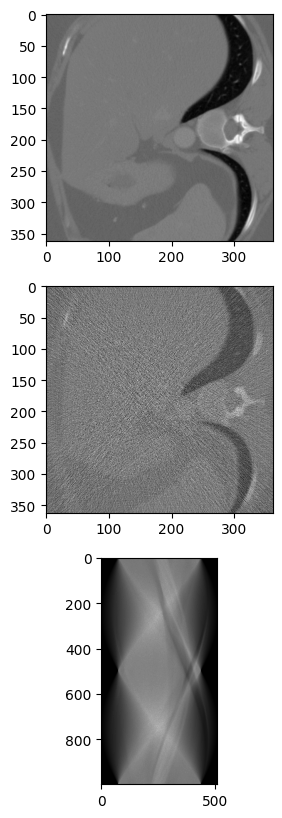

In [18]:
import tensorflow as tf
from tensorflow.keras import layers
import numpy as np

from tensorflow_graphics.geometry.transformation.rotation_matrix_2d import rotate
import tensorflow_addons as tfa


tf.config.experimental_run_functions_eagerly(False)

tf.debugging.set_log_device_placement(True)

class BackprojectionLayer(layers.Layer):
    def __init__(self, num_angles=180, **kwargs):
        super(BackprojectionLayer, self).__init__(**kwargs)
        self.num_angles = num_angles

    def ramp_filter(self, sinogram):
        """Apply 1D ramp filter to sinogram (correct frequency alignment)."""
        sinogram = tf.convert_to_tensor(sinogram)
        sin_sq = tf.squeeze(sinogram, axis=-1)  # [batch, angles, detectors]
        
        # 1D FFT with proper frequency ordering
        n = tf.shape(sin_sq)[-1]
        fft_sin = tf.signal.fft(tf.cast(sin_sq, tf.complex64))
        
        # Create ramp filter matching FFT frequency bins
        freq = tf.abs(tf.signal.fftshift(tf.linspace(-n//2, n//2, n)))
        ramp = tf.cast(freq / tf.reduce_max(freq), tf.complex64)  # Normalized [0,1]
        
        # Apply filter + inverse FFT
        filtered = tf.signal.ifft(fft_sin * ramp)
        return tf.expand_dims(tf.math.real(filtered), -1)  # [batch, angles, detectors, 1]

    def rotate_projection(self, projection, angle):
        """ Rotate a 1D projection back to 2D space at a given angle using pure TensorFlow. """
        angle_rad = angle * np.pi / 180.0
        cos_angle = tf.cos(angle_rad)
        sin_angle = tf.sin(angle_rad)

        # Create rotation matrix
        rotation_matrix = tf.stack([[cos_angle, -sin_angle], 
                                     [sin_angle, cos_angle]])

        # Tile the projection to create a 2D slice
        tiled_tensor = tf.tile(projection, [1, 513])
        rotated_coords = tfa.image.rotate(tiled_tensor, angle_rad, interpolation='nearest')

        return rotated_coords

    def backproject(self, sinogram, num_angles):
        """ Reconstruct the image from the filtered sinogram using backprojection """
        # Apply ramp filter to sinogram
        filtered_sinogram = self.ramp_filter(sinogram)

        # Angles for backprojection
        angles = tf.linspace(0.0, 180.0, num_angles)
        
        # Use tf.vectorized_map to apply rotation for all projections in parallel
        @tf.function
        def rotate_and_add(angle, projection):
            """ Rotate and add backprojections """
            rotated_projection = self.rotate_projection(projection, angle)
            return rotated_projection
        
        # Apply rotation and sum the backprojections
        rotated_images = tf.vectorized_map(
            lambda angle_proj: rotate_and_add(angle_proj[0], angle_proj[1]),
            (angles, filtered_sinogram[0])
        )
        
        # Sum up the rotated images (backprojections) to reconstruct the final image
        reconstructed_image = tf.reduce_sum(rotated_images, axis=0) / num_angles

        # Crop the reconstructed image
        offset_height = (513 - 362) // 2  # Top offset
        offset_width = (513 - 362) // 2   # Left offset
        added_dim = tf.expand_dims(reconstructed_image, axis=-1)
        cropped_image = tf.image.crop_to_bounding_box(
            added_dim,
            offset_height=offset_height,
            offset_width=offset_width,
            target_height=362,
            target_width=362
        )

        return cropped_image

    def call(self, sinogram):
        """ The forward pass of the inverse Radon transform. """
        # tf.print("SINOGRAM SHAPE:")
        # tf.print(tf.shape(sinogram))
        ret = self.backproject(sinogram, self.num_angles)
        # tf.print("SHAPE AT THE END OF THE BACKPROJ")
        # tf.print(ret.shape)
        return ret
    

num_angles = 1000
input_shape = (None, 1000, 513, 1)  # Example input shape: batch, num_detectors, num_angles, 1 channel

inputs = layers.Input(shape=input_shape[1:])  # Remove batch size for input shape
bp_layer = BackprojectionLayer(num_angles=num_angles)(inputs)

# Build and test the model
model = tf.keras.models.Model(inputs, bp_layer)
model.summary()

# Test the layer with eager execution
def test_backprojection(model):

    im = 0
    gttest_path = Path(base_path_win,'gt_test/ground_truth_test_000.hdf5')
    obtest_path = Path(base_path_win,'observations_test/observation_test_000.hdf5')
    file_gttest = h5py.File(gttest_path)
    file_obtest = h5py.File(obtest_path)
    data_gttest = file_gttest['data']
    data_obtest = file_obtest['data']
    img_obtest = data_obtest[im]

    img_gttest = data_gttest[im][:][:]
    # print(img_gttest.shape)
    img_array = np.expand_dims(img_obtest, axis=-1)  # Shape becomes (1000, 513, 1)

    # Step 3: Normalize the image if needed (optional, depending on your model's training)
    #img_array = img_array / 255.0  # Normalize the image data (if your model expects it)

    # Step 4: Add batch dimension (1 image in a batch)
    img_array = np.expand_dims(img_array, axis=0)
    print(img_array.shape)
    img_result = model.predict(img_array)
    print("INPUT DATATYPE: ", img_array.dtype)
    print("OUTPUT DTYPE: ", img_result.dtype)
    # Simulate input data
    input_data = np.random.rand(1, 1000, 513, 1).astype(np.float32)  # Single example sinogram

    fig, axs = plt.subplots(3, 1, figsize = (3, 10))
    axs[0].imshow(img_gttest, cmap = 'grey')
    axs[1].imshow(img_result, cmap = 'grey')
    axs[2].imshow(img_obtest, cmap = 'grey')
    plt.savefig('my_plot_nopool.png', format='png')
    
    # print("Output shape:", img_result.shape)
    return img_result

my_bp_image = test_backprojection(model)

## Part 5: Create visualization and evaluation function

In [ ]:
from skimage.transform import radon, iradon
import skimage
def inference_and_visualize(model: tf.keras.models.Model, im: int=20, file_number: str='000',
                            show_metrics=True,  base_path_win = Path('/mnt/d/Masters/Medical_Imaging'), figsize: tuple=(14, 30)):
    """
    Infers the model , visualizes the gt image, inferred image, noisy sinogram, fbp reconstructed image
    Args: 
        model: tensorflow_model - model to make the inference with
        im: int - number of imag in the file, the max is 128 for this dataset
        file_number: str -number of fil on disk, for this dataset it's 0-256
    """
    gttest_path = Path(base_path_win,f'gt_test/ground_truth_test_{file_number}.hdf5')
    obtest_path = Path(base_path_win,f'observations_test/observation_test_{file_number}.hdf5')
    file_gttest = h5py.File(gttest_path)
    file_obtest = h5py.File(obtest_path)
    data_gttest = file_gttest['data']
    data_obtest = file_obtest['data']
    img_obtest = data_obtest[im]

    img_gttest = data_gttest[im][:][:]
    # print(img_gttest.shape)
    img_array = np.expand_dims(img_obtest, axis=-1)  # Shape becomes (1000, 513, 1)

    # Step 3: Normalize the image if needed (optional, depending on your model's training)
    #img_array = img_array / 255.0  # Normalize the image data (if your model expects it)

    # Step 4: Add batch dimension (1 image in a batch)
    img_array = np.expand_dims(img_array, axis=0)
    img_result = model.predict(img_array)
    # print(img_result.shape)
    img = np.squeeze(img_result)
    # print(img.shape)

    theta = np.linspace(0, 180, 1000, endpoint=False)
    # sinogram = radon(img_obtest, theta=theta)
    rotated_sin = skimage.transform.rotate(img_obtest, 90, resize=True)

    # Perform filtered back projection with a Hann filter os that w can compare the reconstructed image with FBP
    reconstruction_fbp = iradon(rotated_sin, theta=theta, filter_name='ramp', output_size=img_gttest.shape[0], circle=False)
    reconstruction_fbp = skimage.transform.rotate(reconstruction_fbp, 90, resize=False)
    fig, axs = plt.subplots(4, 1, figsize = figsize)
    axs[0].imshow(img_gttest, cmap = 'grey')
    axs[0].set_title("Ground Truth (High dose CT)")
    axs[0].axis("off")
    axs[1].imshow(img, cmap = 'grey')
    axs[1].set_title("Model output (low dose reconstr.)")
    axs[1].axis("off")
    axs[2].imshow(rotated_sin, cmap = 'grey')
    axs[2].set_title("Low dose sinogram")
    axs[2].axis("off")
    axs[3].imshow(reconstruction_fbp, cmap = 'grey')
    axs[3].set_title("Scicit learn Traditional Filtered Backprojection")
    axs[3].axis("off")


    test_gt_exp = tf.expand_dims(img_gttest, -1)
    test_gt_exp = tf.expand_dims(test_gt_exp, 0)

    test_result = tf.expand_dims(img, 0)
    test_result = tf.expand_dims(test_result, -1)

    test_fbp = tf.expand_dims(reconstruction_fbp, 0)
    test_fbp = tf.expand_dims(test_fbp, -1)
    if show_metrics:
        print(test_gt_exp.shape)
        print(test_result.shape)
        print(test_fbp.shape)
        # test_gt_exp = tf.expand_dims(test_gt_exp, 1)
        print("PERCEPTUAL LOSS: ")
        print("inferred: ", perceptual_loss(test_gt_exp, test_result))
        print("fbp reconstruction: ",perceptual_loss(test_gt_exp, test_fbp))
        print(" ")
        print("GRANDIENT LOSS: ")
        print("inferred: ",gradient_loss(test_gt_exp, test_result))
        print("fbp reconstruction: ",gradient_loss(test_gt_exp, test_fbp))
        print(" ")
        print("MSE LOSS: ")
        print("inferred: ",tf.reduce_mean(tf.square(test_gt_exp - test_result)))
        print("fbp reconstruction: ",tf.reduce_mean(tf.square(test_gt_exp - test_fbp)))
        print(" ")
        print("MAE LOSS: ")
        print("inferred: ",tf.reduce_mean(test_gt_exp - test_result))
        print("fbp reconstruction: ",tf.reduce_mean(test_gt_exp - test_fbp))
        print(" ")
        print("PSNR LOSS: ")
        print("inferred: ",tf.image.psnr(test_gt_exp, test_result, 1))
        print("fbp reconstruction: ",tf.image.psnr(test_gt_exp, test_fbp, 1))
        print(" ")
        print("FOURIER LOSS: ")
        print("inferred: ", frequency_loss(test_gt_exp, test_result))
        print("fbp reconstruction: ", frequency_loss(test_gt_exp, test_fbp))
        print(" ")


    return test_gt_exp # return the tensor
        

In [52]:
def inference(model: tf.keras.models.Model, im: int=20, file_number: str='000',
                            show_metrics=True,  base_path_win = Path('/mnt/d/Masters/Medical_Imaging'), figsize: tuple=(14, 30)):
    """
    Infers the model , returns the imag output
    Args: 
        model: tensorflow_model - model to make the inference with
        im: int - number of imag in the file, the max is 128 for this dataset
        file_number: str -number of fil on disk, for this dataset it's 0-256
    """
    gttest_path = Path(base_path_win,f'gt_test/ground_truth_test_{file_number}.hdf5')
    obtest_path = Path(base_path_win,f'observations_test/observation_test_{file_number}.hdf5')
    file_gttest = h5py.File(gttest_path)
    file_obtest = h5py.File(obtest_path)
    data_gttest = file_gttest['data']
    data_obtest = file_obtest['data']
    img_obtest = data_obtest[im]

    img_gttest = data_gttest[im][:][:]
    print(img_gttest.shape)
    img_array = np.expand_dims(img_obtest, axis=-1)  # Shape becomes (1000, 513, 1)

    # Step 3: Normalize the image if needed (optional, depending on your model's training)
    #img_array = img_array / 255.0  # Normalize the image data (if your model expects it)

    # Step 4: Add batch dimension (1 image in a batch)
    img_array = np.expand_dims(img_array, axis=0)
    img_result = model.predict(img_array)
    print("SHAPE OF THE RETURNED TENSOR: ",  img_result.shape)
    return img_result

## Part 6: Get GT Tensor

1/1 [==============================] - 0s 326ms/step


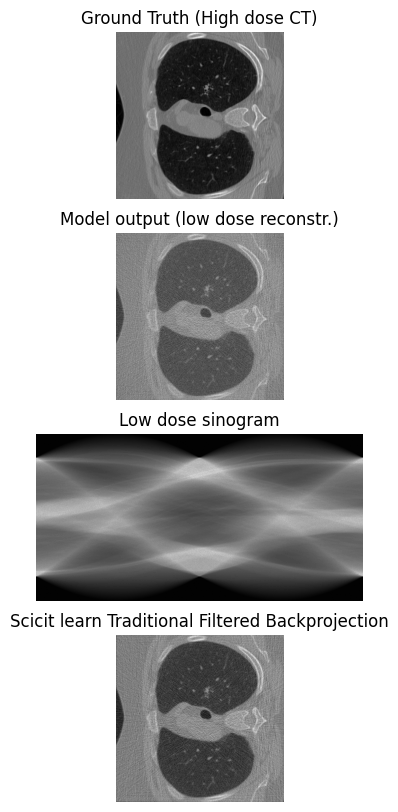

In [21]:
gt_tensor =inference_and_visualize(model, 20, show_metrics=False, figsize=(6, 10))

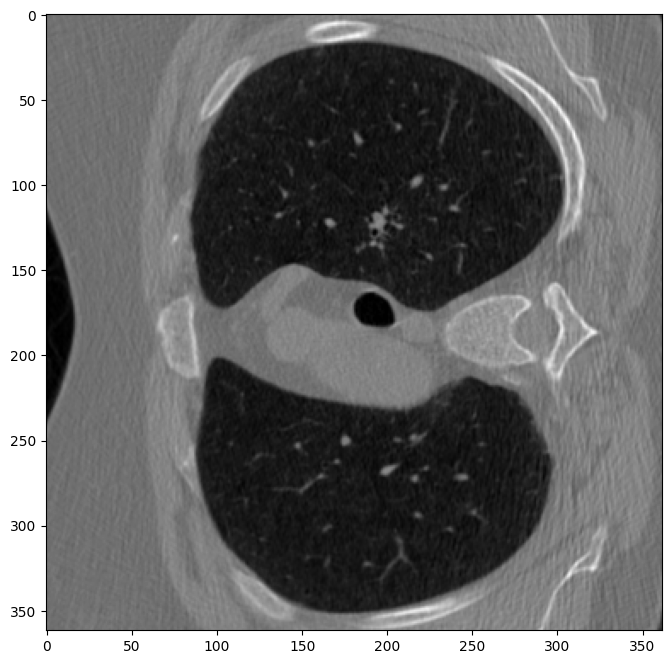

In [22]:
plt.figure(figsize=(8, 8))
myim = tf.squeeze(gt_tensor)
plt.imshow(myim, cmap='gray')

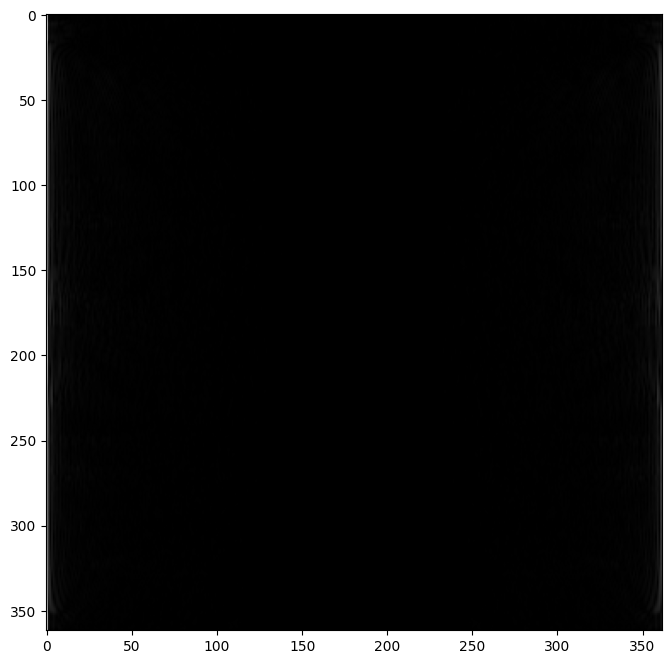

In [23]:
fft_im = tf.signal.fft2d(tf.cast(gt_tensor, tf.complex64))
plt.figure(figsize=(8, 8))
myim = tf.squeeze(tf.math.abs(fft_im))
plt.imshow(myim, cmap='gray')

## Part 7: Creating Patch handling layers

###  Creating Patch Encoder Layer

In [24]:
class PatchEncoder(layers.Layer):
    # num patches has to be 23*23 = 529
    # hidden size should be 256 as the number of colors (OR the 16*16 pixels per color channel? )
    def __init__(self, num_patches, num_hidden):
        self.num_patches = num_patches
        self.linear_projection = layers.Dense(num_hidden)
        self.positional_embedding = layers.Embedding(num_patches, num_hidden)
        super(PatchEncoder, self).__init__()

    def patch_encode(self, img_tensor):
        patchez = tf.image.extract_patches(images=img_tensor,
                           sizes=[1, 16, 16, 1],
                           strides=[1, 16, 16, 1],
                           rates=[1, 1, 1, 1],
                           padding='SAME') # padding will convert to 368 * 368, so 3 pixel is added around which has to be removed later
        resh_patch = tf.reshape(patchez, (patchez.shape[0], 529, 256))
        return resh_patch
    
    def call(self, img_tensor):
        patched_img = self.patch_encode(img_tensor)
        emb_input = tf.range(start=0, limit=self.num_patches, delta=1)
        output = self.linear_projection(patched_img) + self.positional_embedding(emb_input)
        return output
    
    

In [25]:
patch_enc = PatchEncoder(529, 256)
result = patch_enc(tf.zeros(shape=(1, 362, 362, 1)))
result.shape

TensorShape([1, 529, 256])

###  Creating Image restore from patches layer

In [26]:
class PatchesToImage(layers.Layer):
    def __init__(self, imgh, imgw, imgc, patsz, is_squeeze=True, **kwargs):
        super(PatchesToImage, self).__init__(**kwargs)
        self.H = (imgh // patsz) * patsz
        self.W = (imgw // patsz) * patsz
        self.C = imgc
        self.P = patsz
        self.is_squeeze = is_squeeze
        
    def call(self, inputs):
        bs = tf.shape(inputs)[0]
        rows, cols = self.H // self.P, self.W // self.P
        
        # Reshape to [batch, rows, cols, P^2, C]
        patches = tf.reshape(inputs, [bs, rows, cols, self.P**2, self.C])
        
        # Define a function to process each channel using tensor indexing
        def tile_patches(ii):
            # Select the i-th channel's patches [batch, rows, cols, P^2]
            pats = patches[..., ii]
            # Reconstruct spatial structure for this channel
            img = tf.nn.depth_to_space(pats, self.P)  # Output shape: [batch, H, W, 1]
            return img
        
        # Process all channels in parallel (no Python list indexing)
        img = tf.map_fn(
            fn=tile_patches, 
            elems=tf.range(self.C), 
            fn_output_signature=inputs.dtype
        )
        
        # Combine channels and adjust dimensions
        img = tf.squeeze(img, axis=-1)   # Shape: [C, batch, H, W]
        img = tf.transpose(img, perm=[1, 2, 3, 0])  # Shape: [batch, H, W, C]
        
        # Squeeze channel dimension if needed
        if self.is_squeeze and self.C == 1:
            img = tf.squeeze(img, axis=-1)
        
        return img

## Part 8: Creating Transformer Encoder Layer

In [27]:
class TransformerEncoder(layers.Layer):
    # vision transformer article: https://arxiv.org/pdf/2010.11929
    def __init__(self, num_heads, hidden_size):
        self.norm_1 = layers.Normalization()
        self.norm_2 = layers.Normalization()

        self.multi_head_attention = layers.MultiHeadAttention(num_heads, hidden_size)

        self.dense_1 = layers.Dense(hidden_size, activation=tf.nn.gelu)
        self.dense_2 = layers.Dense(hidden_size, activation=tf.nn.gelu)
        super(TransformerEncoder, self).__init__()

    def call(self, patch_tensor):
        l1 = self.norm_1(patch_tensor)
        l2 = self.multi_head_attention(l1, l1)
        l3 = layers.Add()([l2, patch_tensor])
        l4 = self.norm_2(l3)
        l5 = self.dense_1(l4)
        l6 = self.dense_2(l5)
        output = layers.Add()([l6, l3])

        return output

In [28]:
t1 = TransformerEncoder(4, 256)
tres = t1(result)
tres.shape

TensorShape([1, 529, 256])

In [29]:
t2 = TransformerEncoder(4, 256)
tres2 = t2(tres)
tres2.shape

TensorShape([1, 529, 256])

In [30]:
resh = layers.Reshape((23, 23, 256))
rshres = resh(tres2)
rshres.shape

TensorShape([1, 23, 23, 256])

## Part 9: Creating FFN network

### Creating Fourier Feature Mapping Layer

In [31]:
import math
class FourierFeatureMapping(layers.Layer):
    def __init__(self, num_features=128, scale=10.0, **kwargs):
        super().__init__(**kwargs)
        self.num_features = num_features
        self.scale = scale  # Controls frequency bandwidth

    def build(self, input_shape):
        # Random Fourier projection matrix (fixed or trainable)
        self.B = self.add_weight(
            name="B",
            shape=(input_shape[-1], self.num_features),
            initializer=tf.random_normal_initializer(stddev=self.scale),
            trainable=True,  # Set to False for fixed frequencies
        )
        super().build(input_shape)

    def call(self, inputs):
        # Project coordinates into Fourier space: γ(v) = [sin(2πBv), cos(2πBv)]
        proj = 2 * tf.constant(math.pi) * tf.matmul(inputs, self.B)
        return tf.concat([tf.sin(proj), tf.cos(proj)], axis=-1)

### Building a simple network to see what these fourier features are doing with my image exactly

In [32]:
def build_ffn_network(input_shape=(None, 1000, 513, 1), hidden_units=256, num_layers=4, num_angles=1000):
    # Input layer (keep exactly as requested)
    inputs = layers.Input(shape=input_shape[1:])  # (1000, 513, 1)
    
    # Backprojection layer - wrap stop_gradient in Lambda
    bp = BackprojectionLayer(num_angles=num_angles)(inputs)
    sg = layers.Lambda(lambda x: tf.stop_gradient(x))(bp)  # Proper Keras operation
    expand_layer = layers.Lambda(lambda x: tf.expand_dims(x, axis=0))(sg)
    
    def generate_coords(x):
        H, W = 362, 362
        coords = tf.stack(tf.meshgrid(
            tf.linspace(-1.0, 1.0, H),
            tf.linspace(-1.0, 1.0, W),
            indexing='ij'
        ), axis=-1)  # (362, 362, 2)
        return tf.expand_dims(coords, axis=0)  # (1, 362, 362, 2)
    
    coords = layers.Lambda(generate_coords, name="coord_gen")(expand_layer)

    # Feature processing with EXPLICIT SINGLE BATCH
    def process_features(x):
        coords, pixels = x
        # Verify single batch dimension
        
        # Flatten while preserving batch=1
        coords_flat = tf.reshape(coords, [1, 362*362, 2])  # (1, 131044, 2)
        pixels_flat = tf.reshape(pixels, [1, 362*362, 1])  # (1, 131044, 1)
        return tf.concat([coords_flat, pixels_flat], axis=-1)  # (1, 131044, 3)
    
    features = layers.Lambda(process_features, name="flat_feat")([coords, expand_layer])

    # Fourier features with batch-aware slicing
    ffm = FourierFeatureMapping(num_features=64, scale=10.0)
    fourier_feats = ffm(layers.Lambda(lambda x: x[0, :, :2], name="coord_slice")(features))
    
    def reshape_output(x):
        return tf.reshape(x, [1, 362, 362, 128])  # Explicit single batch
    
    output = layers.Lambda(reshape_output, name="output_reshape")(fourier_feats)
    norm = layers.Normalization()(output)
    # Final connection with batch removal
    # final_output = layers.Lambda(lambda x: x[0], name="batch_remove")(output)
    
    return models.Model(inputs=inputs, outputs=norm, name="ffn_denoiser")

In [33]:
16773632  / (362*362)


128.0

In [34]:
model = build_ffn_network()
model.compile(optimizer='adam', loss=custom_loss)
model.summary()
gt_tensor =inference(model, 20, show_metrics=False)
gt_tensor.shape

Model: "ffn_denoiser"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 1000, 513, 1)]       0         []                            
                                                                                                  
 backprojection_layer_1 (Ba  (362, 362, 1)                0         ['input_3[0][0]']             
 ckprojectionLayer)                                                                               
                                                                                                  
 lambda (Lambda)             (362, 362, 1)                0         ['backprojection_layer_1[0][0]
                                                                    ']                            
                                                                                       

(362, 362)
1/1 [==============================] - 1s 1s/step
SHAPE OF THE RETURNED TENSOR:  (1, 362, 362, 128)


(1, 362, 362, 128)

In [35]:
gt_tensor[0, : , : , 0].shape

(362, 362)

### Visualizing the fourier features:

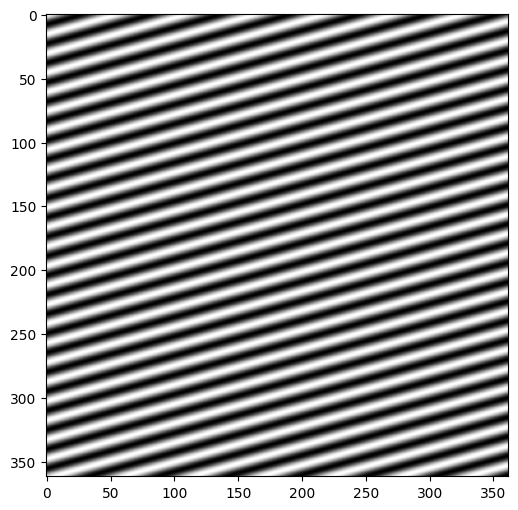

In [36]:
plt.figure(figsize=(6, 6))
plt.imshow(gt_tensor[0, : , : , 9], cmap='grey')

### Visualizing multiple features

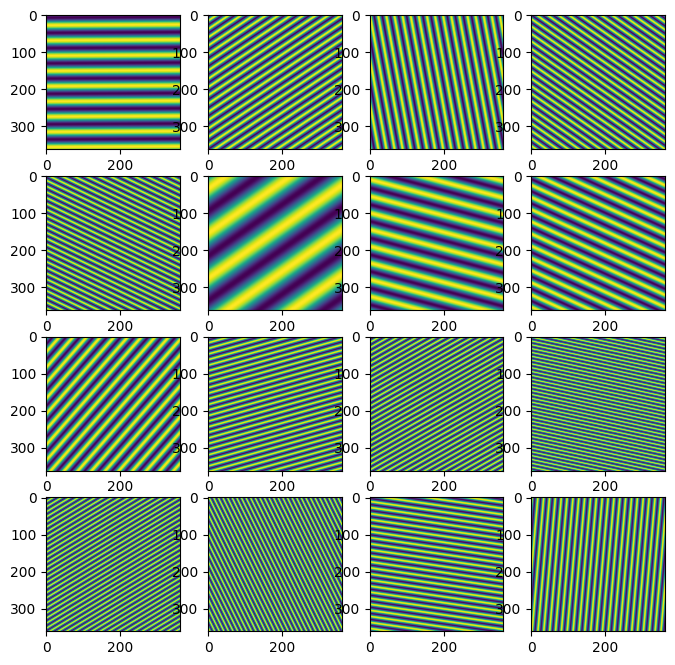

In [37]:
myims = gt_tensor[0, : , : , :16]
fig, axs = plt.subplots(4, 4, figsize = (8, 8))
for i, ax in enumerate(axs.flat):
    ax.imshow(myims[:, :, i])

We can clearly see the sinusoidal patterns after inputting our fbp reconstructd sinogram into the FF layer. However I'M not quite sure how these will help us making the image sharper

### Adding up all the fourier features to see what image they are contructing: 

In [38]:
nf = 2048
def build_ffn_network_add(input_shape=(None, 1000, 513, 1), hidden_units=256, num_layers=4, num_angles=1000):
    # Input layer (keep exactly as requested)
    inputs = layers.Input(shape=input_shape[1:])  # (1000, 513, 1)
    
    # Backprojection layer - wrap stop_gradient in Lambda
    bp = BackprojectionLayer(num_angles=num_angles)(inputs)
    sg = layers.Lambda(lambda x: tf.stop_gradient(x))(bp)  # Proper Keras operation
    expand_layer = layers.Lambda(lambda x: tf.expand_dims(x, axis=0))(sg)
    
    def generate_coords(x):
        H, W = 362, 362
        coords = tf.stack(tf.meshgrid(
            tf.linspace(-1.0, 1.0, H),
            tf.linspace(-1.0, 1.0, W),
            indexing='ij'
        ), axis=-1)  # (362, 362, 2)
        return tf.expand_dims(coords, axis=0)  # (1, 362, 362, 2)
    
    coords = layers.Lambda(generate_coords, name="coord_gen")(expand_layer)

    # Feature processing with EXPLICIT SINGLE BATCH
    def process_features(x):
        coords, pixels = x
        # Verify single batch dimension
        
        # Flatten while preserving batch=1
        coords_flat = tf.reshape(coords, [1, 362*362, 2])  # (1, 131044, 2)
        pixels_flat = tf.reshape(pixels, [1, 362*362, 1])  # (1, 131044, 1)
        return tf.concat([coords_flat, pixels_flat], axis=-1)  # (1, 131044, 3)
    
    features = layers.Lambda(process_features, name="flat_feat")([coords, expand_layer])

    # Fourier features with batch-aware slicing
    ffm = FourierFeatureMapping(num_features=nf, scale=10.0)
    fourier_feats = ffm(layers.Lambda(lambda x: x[0, :, :2], name="coord_slice")(features))
    
    def reshape_output(x):
        return tf.reshape(x, [1, 362, 362, nf*2])  # Explicit single batch
    
    reshape = layers.Lambda(reshape_output, name="output_reshape")(fourier_feats)
    output = layers.Conv2D(1, (3,3), activation='linear', padding='same')(reshape)
    # Final connection with batch removal
    # final_output = layers.Lambda(lambda x: x[0], name="batch_remove")(output)
    
    return models.Model(inputs=inputs, outputs=output, name="ffn_denoiser")

Model: "ffn_denoiser"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 1000, 513, 1)]       0         []                            
                                                                                                  
 backprojection_layer_2 (Ba  (362, 362, 1)                0         ['input_4[0][0]']             
 ckprojectionLayer)                                                                               
                                                                                                  
 lambda_2 (Lambda)           (362, 362, 1)                0         ['backprojection_layer_2[0][0]
                                                                    ']                            
                                                                                       

2025-04-23 10:27:01.208485: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:442] Loaded cuDNN version 8700


1/1 [==============================] - 3s 3s/step
SHAPE OF THE RETURNED TENSOR:  (1, 362, 362, 1)


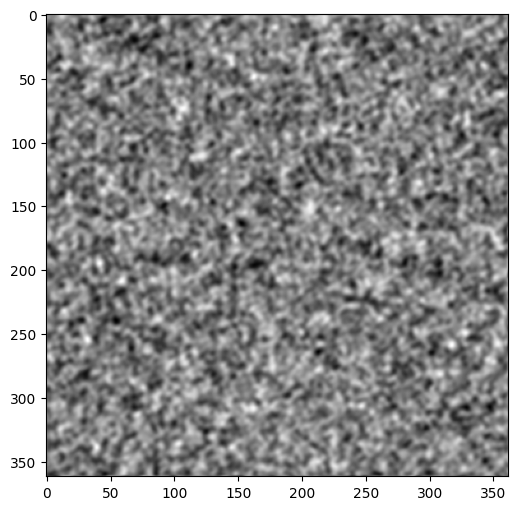

In [39]:
model = build_ffn_network_add()
model.compile(optimizer='adam', loss=custom_loss)
model.summary()
output =inference(model, 20, show_metrics=False)
output.shape
plt.figure(figsize=(6, 6))
plt.imshow(output[0, : , : , 0], cmap='grey')

It looks very much like noise

## Part 10: Creating a CNN + FNN network:

In [40]:
def build_cnn_ffn_network(input_shape=(None, 1000, 513, 1), hidden_units=256, ks=3, num_features=512):
    # Input layer (keep exactly as requested)
    inputs = layers.Input(shape=input_shape[1:])  # (1000, 513, 1)
    
    # Backprojection layer - wrap stop_gradient in Lambda
    bp = BackprojectionLayer(num_angles=num_angles)(inputs)
    sg = layers.Lambda(lambda x: tf.stop_gradient(x))(bp)  # Proper Keras operation
    expand_layer = layers.Lambda(lambda x: tf.expand_dims(x, axis=0))(sg)
    
    def generate_coords(x):
        H, W = 362, 362
        coords = tf.stack(tf.meshgrid(
            tf.linspace(-1.0, 1.0, H),
            tf.linspace(-1.0, 1.0, W),
            indexing='ij'
        ), axis=-1)  # (362, 362, 2)
        return tf.expand_dims(coords, axis=0)  # (1, 362, 362, 2)
    
    coords = layers.Lambda(generate_coords, name="coord_gen")(expand_layer)

    # Feature processing with EXPLICIT SINGLE BATCH
    def process_features(x):
        coords, pixels = x
        # Verify single batch dimension
        
        # Flatten while preserving batch=1
        coords_flat = tf.reshape(coords, [1, 362*362, 2])  # (1, 131044, 2)
        pixels_flat = tf.reshape(pixels, [1, 362*362, 1])  # (1, 131044, 1)
        return tf.concat([coords_flat, pixels_flat], axis=-1)  # (1, 131044, 3)
    
    features = layers.Lambda(process_features, name="flat_feat")([coords, expand_layer])

    # Fourier features with batch-aware slicing
    ffm = FourierFeatureMapping(num_features=num_features, scale=10.0)
    fourier_feats = ffm(layers.Lambda(lambda x: x[0, :, :2], name="coord_slice")(features))
    
    def reshape_output(x):
        return tf.reshape(x, [1, 362, 362, num_features*2])  # Explicit single batch
    
    output = layers.Lambda(reshape_output, name="output_reshape")(fourier_feats)
    norm = layers.Normalization()(output)

    x1 = layers.Conv2D(128, (ks,ks), activation='relu', padding='same')(expand_layer)
    x1a = layers.Conv2D(128, (ks,ks), activation='relu', padding='same')(x1)
    x1b = layers.Conv2D(128, (ks,ks), activation='relu', padding='same')(x1a)
    x1c = layers.Conv2D(128, (ks,ks), activation='relu', padding='same')(x1b)

    conc = layers.Concatenate()([norm, x1c])

    output = layers.Conv2D(1, (3,3), activation='linear', padding='same')(conc)
    
    return models.Model(inputs=inputs, outputs=output, name="ffn_denoiser")

Model: "ffn_denoiser"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_5 (InputLayer)        [(None, 1000, 513, 1)]       0         []                            
                                                                                                  
 backprojection_layer_3 (Ba  (362, 362, 1)                0         ['input_5[0][0]']             
 ckprojectionLayer)                                                                               
                                                                                                  
 lambda_4 (Lambda)           (362, 362, 1)                0         ['backprojection_layer_3[0][0]
                                                                    ']                            
                                                                                       

TensorShape([1, 362, 362, 1])

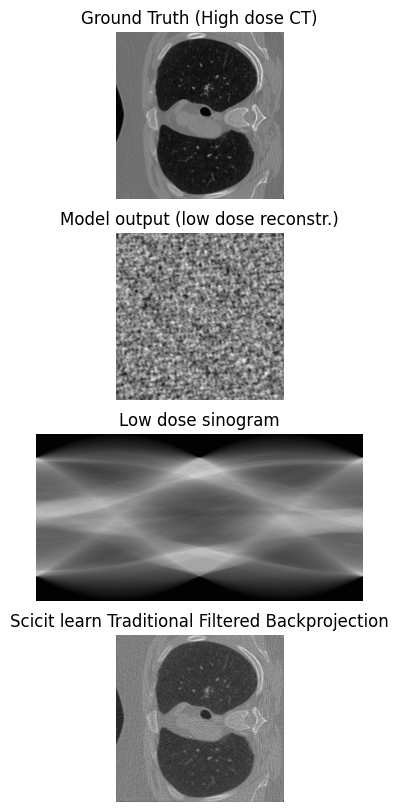

In [41]:
model = build_cnn_ffn_network()
model.compile(optimizer='adam', loss=custom_loss)
model.summary()
gt_tensor =inference_and_visualize(model, 20, show_metrics=False, figsize=(6, 10))
gt_tensor.shape

## Part 11: Fitting CNN + FNN Model

In [42]:
GGG

NameError: name 'GGG' is not defined

In [ ]:
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint

observation_files = [os.path.join(OBSERVATION_DIR, f) for f in os.listdir(OBSERVATION_DIR) if f.endswith('.hdf5')]
ground_truth_files = [os.path.join(GROUND_TRUTH_DIR, f) for f in os.listdir(GROUND_TRUTH_DIR) if f.endswith('.hdf5')]
obs_val_files = [os.path.join(VAL_OBS_DIR, f) for f in os.listdir(VAL_OBS_DIR) if f.endswith('.hdf5')]
gt_val_files = [os.path.join(VAL_GT_DIR, f) for f in os.listdir(VAL_GT_DIR) if f.endswith('.hdf5')]
print(observation_files)
# For testing, you can limit the number of files loaded
observation_files = observation_files[0:16]  # Load just 8 files for testing
ground_truth_files = ground_truth_files[0:16]  # Load just 8 files for testing

obs_val_files = obs_val_files[:1]
gt_val_files = gt_val_files[:1]

train_dataset = create_dataset(observation_files, ground_truth_files, BATCH_SIZE)
val_dataset = create_dataset(obs_val_files, gt_val_files, 1)
# verify the training dataset
for obs, gt in train_dataset.take(1):  # Take one batch
        print("Observation batch shape:", obs.shape)
        print("Ground truth batch shape:", gt.shape)
# calculate steps per peoch
steps_per_epoch=len(observation_files*128) // BATCH_SIZE
print(steps_per_epoch)

checkpoint_cb = ModelCheckpoint(
    'model_checkpoint.h5',  # Path where the checkpoint will be saved
    save_best_only=True,    # Save only the best model (based on monitored metric)
    monitor='val_loss',         # Monitor the training loss
    mode='min',             # Save when the loss decreases (best model)
    verbose=1               # Print messages when the model is saved
)

#dropout-ot megnezni megegyszer
lr_scheduler = ReduceLROnPlateau(monitor='loss', factor=0.5, patience=2, min_lr=1e-6)
# , callbacks=[lr_scheduler]
model.fit(train_dataset, epochs=2, steps_per_epoch=steps_per_epoch)

1/1 [==============================] - 0s 470ms/step


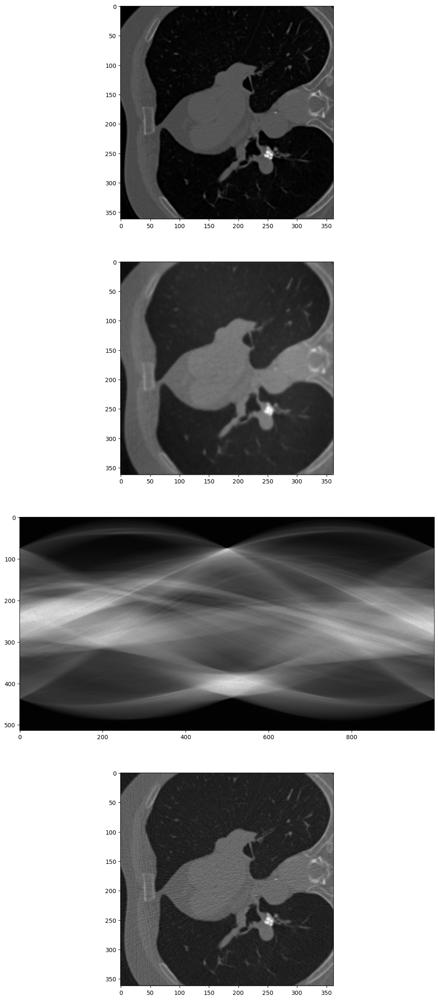

In [ ]:
out_tensor = inference_and_visualize(model, 45, show_metrics=False)

SUMMARY: the model does good on global features, the edges are sharp, but it fails to give accurate reprsentations of the smaller structures, like the bones.

## Part X: Building ViT + ResNet + FNN model:

### Creating ResNet layer

In [44]:
from tensorflow.keras import layers, Model

class ResNetBlock(Model):
    def __init__(self, filters, kernel_size=3, stride=1, conv_shortcut=False):
        super(ResNetBlock, self).__init__()
        self.conv_shortcut = conv_shortcut
        
        # Main path layers
        self.conv1 = layers.Conv2D(filters, kernel_size, strides=stride, 
                                  padding='same', use_bias=False)
        self.bn1 = layers.BatchNormalization()
        self.relu1 = layers.ReLU()
        
        self.conv2 = layers.Conv2D(filters, kernel_size, padding='same', use_bias=False)
        self.bn2 = layers.BatchNormalization()
        
        # Shortcut path
        if conv_shortcut:
            self.shortcut = tf.keras.Sequential([
                layers.Conv2D(filters, 1, strides=stride, use_bias=False),
                layers.BatchNormalization()
            ])
        else:
            self.shortcut = lambda x: x
            
        self.relu2 = layers.ReLU()
    
    def call(self, inputs, training=False):
        # Main path
        x = self.conv1(inputs)
        x = self.bn1(x, training=training)
        x = self.relu1(x)
        
        x = self.conv2(x)
        x = self.bn2(x, training=training)
        
        # Shortcut path
        shortcut = self.shortcut(inputs)
        
        # Add main path and shortcut
        x = layers.add([x, shortcut])
        return self.relu2(x)

### Building ViT + ResNet + FNN network

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_10 (InputLayer)       [(None, 1000, 513, 1)]       0         []                            
                                                                                                  
 backprojection_layer_8 (Ba  (362, 362, 1)                0         ['input_10[0][0]']            
 ckprojectionLayer)                                                                               
                                                                                                  
 tf.stop_gradient_4 (TFOpLa  (362, 362, 1)                0         ['backprojection_layer_8[0][0]
 mbda)                                                              ']                            
                                                                                            

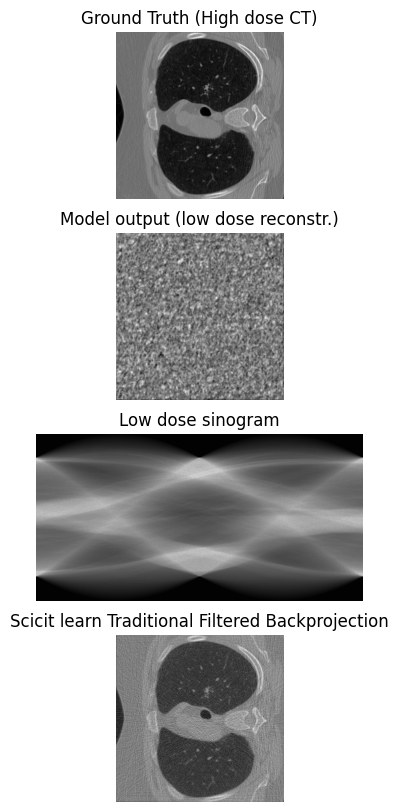

In [57]:
input_shape = (None, 1000, 513, 1)  # Example input shape: batch, num_detectors, num_angles, 1 channel
output_shape = (362, 362, 1)
num_angles = 1000
n_heads = 6 # number of multi head attention heads
nf = 128


inputs = layers.Input(shape=input_shape[1:])  # Remove batch size for input shape

bp_layer = BackprojectionLayer(num_angles=num_angles)(inputs)
sg = tf.stop_gradient(bp_layer)
expand_layer = layers.Lambda(lambda x: tf.expand_dims(x, axis=0))(sg)

def generate_coords(x):
        H, W = 362, 362
        coords = tf.stack(tf.meshgrid(
            tf.linspace(-1.0, 1.0, H),
            tf.linspace(-1.0, 1.0, W),
            indexing='ij'
        ), axis=-1)  # (362, 362, 2)
        return tf.expand_dims(coords, axis=0)  # (1, 362, 362, 2)
    
coords = layers.Lambda(generate_coords, name="coord_gen")(expand_layer)

# Feature processing with SINGLE BATCH
def process_features(x):
    coords, pixels = x
    # Verify single batch dimension
    
    # Flatten while preserving batch=1
    coords_flat = tf.reshape(coords, [1, 362*362, 2])  # (1, 131044, 2)
    pixels_flat = tf.reshape(pixels, [1, 362*362, 1])  # (1, 131044, 1)
    return tf.concat([coords_flat, pixels_flat], axis=-1)  # (1, 131044, 3)

features = layers.Lambda(process_features, name="flat_feat")([coords, expand_layer])

# Fourier features with batch-aware slicing
ffm = FourierFeatureMapping(num_features=nf, scale=10.0)
fourier_feats = ffm(layers.Lambda(lambda x: x[0, :, :2], name="coord_slice")(features))

def reshape_output(x):
        return tf.reshape(x, [1, 362, 362, nf*2])
    
ff_reshaped = layers.Lambda(reshape_output, name="output_reshape")(fourier_feats)

# Trying to reverse the non-linar transformation of the FourierFeatureMapping for being able to combine with the rest of the features
x1 = layers.Conv2D(64, (3,3), activation='relu', padding='same')(ff_reshaped)
x1a = layers.Conv2D(64, (3,3), activation='relu', padding='same')(x1)
x1b = layers.Conv2D(64, (3,3), activation='relu', padding='same')(x1a)
x1c = layers.Conv2D(64, (3,3), activation='relu', padding='same')(x1b)

output_ff = layers.Conv2D(1, (3,3), activation='linear', padding='same', name = 'output_ff')(x1c)
# conc = layers.Concatenate()([ff_reshaped, x1c])

patch_enc = PatchEncoder(529, 256)(expand_layer)

t1 = TransformerEncoder(n_heads, 256)(patch_enc)

t2 = TransformerEncoder(n_heads, 256)(t1)

t3 = TransformerEncoder(n_heads, 256)(t2)

t4 = TransformerEncoder(n_heads, 256)(t3)

resh = layers.Reshape([23, 23, 256])(t4)

rec = PatchesToImage(imgh=368, imgw=368, imgc=1, patsz = 16, is_squeeze=False)(resh)

norm = layers.Normalization()(rec)

crop = layers.Cropping2D(((3,3), (3,3)))(norm)

r1 = ResNetBlock(128)(expand_layer)
r2 = ResNetBlock(128)(r1)
r3 = ResNetBlock(128)(r2)
r4 = ResNetBlock(128)(r3)
r5 = ResNetBlock(128)(r4)
r6 = ResNetBlock(128)(r5)

resnet_sconv = layers.Conv2D(1, (1,1), activation='linear', padding='same')(r6)

skip = layers.Add()([crop, resnet_sconv, output_ff])

# skip = layers.Add()([single_conv, expand_layer])

# Build and test the model
model = tf.keras.models.Model(inputs, skip)


# Create the model
# input_shape = (1000, 513, 1)  # Single sinogram as input
# output_shape = (362, 362, 1)  # Reconstructed image
# model = unet_model(input_shape, output_shape)

# Set up Adam optimizer with gradient clipping
# optimizer = Adam(clipvalue=1.0)  # Clip gradients by value (to prevent explosion)
# Adam = Adam(clipnorm=1.0)

lr_schedule = tf.keras.optimizers.schedules.PiecewiseConstantDecay(
    boundaries=[150, 250, 500, 1000, 2000],      # Steps where the learning rate will change
    values=[0.001, 0.005, 0.0001, 0.0005, 0.00001, 0.00005]  # Corresponding learning rates at those boundaries
)

Adam = tf.keras.optimizers.Adam(learning_rate=0.001, clipnorm = 1.0)
Nadam = tf.keras.optimizers.Nadam(learning_rate=0.01)


AdamW = tf.keras.optimizers.AdamW(
    learning_rate=0.001,
    weight_decay=1e-4,  # Critical hyperparameter
    beta_1=0.75,
    beta_2=0.895,
    epsilon=1e-07
)

# Compile the model
# model.compile(optimizer='Adam', loss=custom_loss, metrics=['mse'])
model.compile(optimizer=AdamW, loss=custom_loss)
print(model.summary())
gt_tensor =inference_and_visualize(model, 20, show_metrics=False, figsize=(6, 10))

## Part XI Creating image logging callback layer

In [46]:
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, TensorBoard, LambdaCallback
import datetime

file_number = '000'
gttest_path = Path(base_path_win,f'gt_test/ground_truth_test_{file_number}.hdf5')
obtest_path = Path(base_path_win,f'observations_test/observation_test_{file_number}.hdf5')
file_obtest = h5py.File(obtest_path)
data_obtest = file_obtest['data']
img_obtest = data_obtest[45]
# print(img_gttest.shape)
img_array = np.expand_dims(img_obtest, axis=-1)  # Shape becomes (1000, 513, 1)

# Step 3: Normalize the image if needed (optional, depending on your model's training)
#img_array = img_array / 255.0  # Normalize the image data (if your model expects it)

# Step 4: Add batch dimension (1 image in a batch)
img_array = np.expand_dims(img_array, axis=0)

img_tensor = tf.convert_to_tensor(img_array, dtype=tf.float32)

logdir_tb = "logs/TensorBoard/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
# Define the basic TensorBoard callback.
tb_callback = TensorBoard(
    log_dir=logdir_tb,
    histogram_freq=0,
    write_graph=True,
    write_grads=True,
    write_images=True,
    write_steps_per_second=True,
    update_freq=25,
    profile_batch=0,
    embeddings_freq=1,
    embeddings_metadata=None
)
file_writer_cm = tf.summary.create_file_writer(logdir_tb + '/im')
    
def log_image(batch, logs):
  # Use the model to predict the values from the validation dataset.
  if (batch + 1) % 128 ==0:
    train_sin = img_tensor
    test_pred = model.predict(train_sin, verbose=0)

    # Log the confusion matrix as an image summary.
    with file_writer_cm.as_default():
      tf.summary.image("input_sinogram", (train_sin+1)/2.0, step=batch) # we need to scale from [-1, 1] to [0, 1] otherwise TensorBoard is displaying the image wrong
      tf.summary.image("predicted_image", (test_pred+1)/2.0, step=batch)

im_log_callback = LambdaCallback(on_batch_end=log_image)

## Part XI: Fitting Vit + FNN model

In [ ]:
stop

In [ ]:
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, TensorBoard

observation_files = [os.path.join(OBSERVATION_DIR, f) for f in os.listdir(OBSERVATION_DIR) if f.endswith('.hdf5')]
ground_truth_files = [os.path.join(GROUND_TRUTH_DIR, f) for f in os.listdir(GROUND_TRUTH_DIR) if f.endswith('.hdf5')]
obs_val_files = [os.path.join(VAL_OBS_DIR, f) for f in os.listdir(VAL_OBS_DIR) if f.endswith('.hdf5')]
gt_val_files = [os.path.join(VAL_GT_DIR, f) for f in os.listdir(VAL_GT_DIR) if f.endswith('.hdf5')]
print(observation_files)
# For testing, you can limit the number of files loaded
observation_files = observation_files[:64]  # Load just 8 files for testing
ground_truth_files = ground_truth_files[:64]  # Load just 8 files for testing

obs_val_files = obs_val_files[:16]
gt_val_files = gt_val_files[:16]

train_dataset = create_dataset(observation_files, ground_truth_files, BATCH_SIZE)
val_dataset = create_dataset(obs_val_files, gt_val_files, 1)
# verify the training dataset
for obs, gt in train_dataset.take(1):  # Take one batch
        print("Observation batch shape:", obs.shape)
        print("Ground truth batch shape:", gt.shape)
# calculate steps per peoch
steps_per_epoch=len(observation_files*128) // BATCH_SIZE
print(steps_per_epoch)
logdir_cb = "logs/checkpoints/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S") + '.h5'
checkpoint_cb = ModelCheckpoint(
    logdir_cb,  # Path where the checkpoint will be saved
    save_best_only=True,    # Save only the best model (based on monitored metric)
    monitor='loss',         # Monitor the training loss
    mode='min',             # Save when the loss decreases (best model)
    verbose=1               # Print messages when the model is saved
)

#dropout-ot megnezni megegyszer
lr_scheduler = ReduceLROnPlateau(monitor='loss', factor=0.5, patience=2, min_lr=1e-6)

# , callbacks=[lr_scheduler]
model.fit(train_dataset, epochs=1, steps_per_epoch=steps_per_epoch, callbacks=[checkpoint_cb, tb_callback, im_log_callback])

['/mnt/d/Masters/Medical_Imaging/observations_train/observation_train_000.hdf5', '/mnt/d/Masters/Medical_Imaging/observations_train/observation_train_001.hdf5', '/mnt/d/Masters/Medical_Imaging/observations_train/observation_train_002.hdf5', '/mnt/d/Masters/Medical_Imaging/observations_train/observation_train_003.hdf5', '/mnt/d/Masters/Medical_Imaging/observations_train/observation_train_004.hdf5', '/mnt/d/Masters/Medical_Imaging/observations_train/observation_train_005.hdf5', '/mnt/d/Masters/Medical_Imaging/observations_train/observation_train_006.hdf5', '/mnt/d/Masters/Medical_Imaging/observations_train/observation_train_007.hdf5', '/mnt/d/Masters/Medical_Imaging/observations_train/observation_train_008.hdf5', '/mnt/d/Masters/Medical_Imaging/observations_train/observation_train_009.hdf5', '/mnt/d/Masters/Medical_Imaging/observations_train/observation_train_010.hdf5', '/mnt/d/Masters/Medical_Imaging/observations_train/observation_train_011.hdf5', '/mnt/d/Masters/Medical_Imaging/observa

1/1 [==============================] - 0s 474ms/step


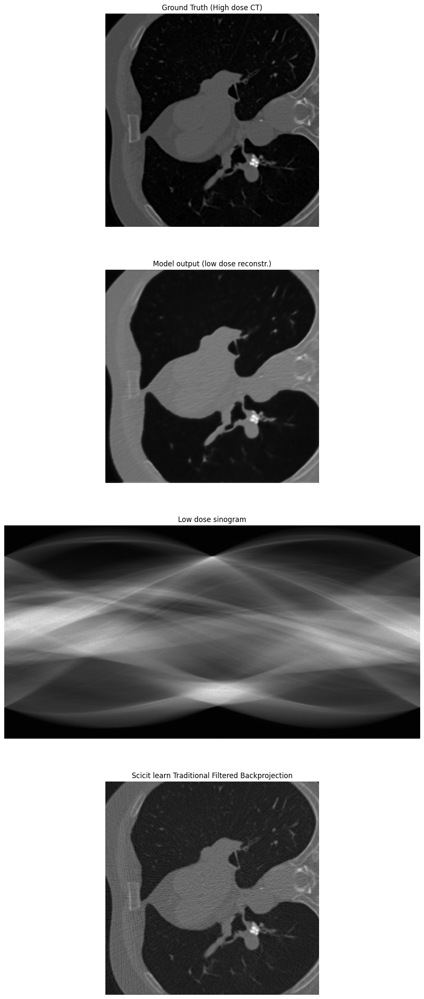

In [54]:
out_tensor = inference_and_visualize(model,45, show_metrics=False)

1/1 [==============================] - 0s 496ms/step


<tf.Tensor: shape=(1, 362, 362, 1), dtype=float32, numpy=
array([[[[0.22406429],
         [0.21503295],
         [0.20792785],
         ...,
         [0.22968458],
         [0.17280772],
         [0.10068367]],

        [[0.21639194],
         [0.21525034],
         [0.20603326],
         ...,
         [0.24303037],
         [0.19188304],
         [0.11306652]],

        [[0.21456121],
         [0.21913093],
         [0.21471328],
         ...,
         [0.25178263],
         [0.2235112 ],
         [0.14639682]],

        ...,

        [[0.21791744],
         [0.22112139],
         [0.21805035],
         ...,
         [0.20001897],
         [0.16290492],
         [0.12179647]],

        [[0.21836089],
         [0.21644367],
         [0.21444248],
         ...,
         [0.18829313],
         [0.14607732],
         [0.11269771]],

        [[0.22307971],
         [0.21766803],
         [0.21422857],
         ...,
         [0.16716656],
         [0.11384946],
         [0.09042586]]]], dty

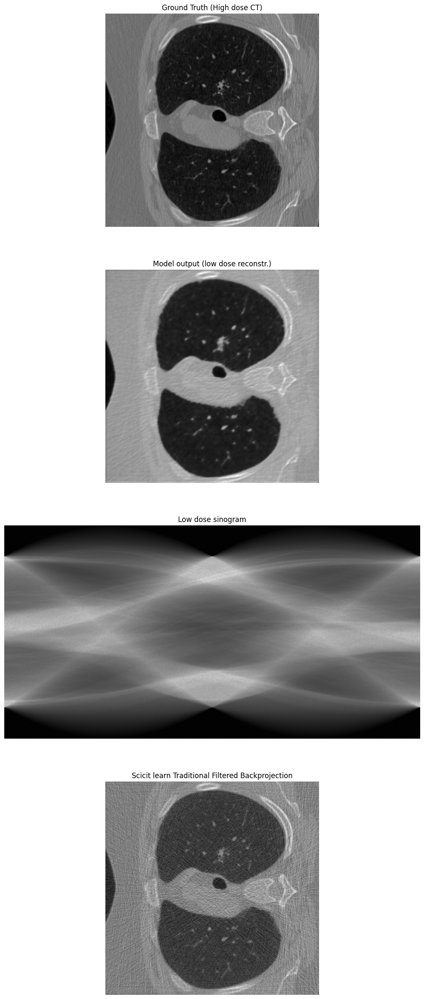

In [55]:
inference_and_visualize(model,20, show_metrics=False)

In [ ]:
model = tf.keras.models.load_model(
    "logs/checkpoints/20250416-105911.h5",
    custom_objects={
        "BackprojectionLayer": BackprojectionLayer,
        "PatchEncoder":PatchEncoder,
        "TransformerEncoder":TransformerEncoder,
        "PatchesToImage":PatchesToImage,
        "ResNetBlock":ResNetBlock,
        "FourierFeatureMapping":FourierFeatureMapping,
        "custom_loss": custom_loss
    }
)

In [ ]:
model.fit(train_dataset, epochs=2, steps_per_epoch=steps_per_epoch, callbacks=[checkpoint_cb, tb_callback, im_log_callback])

Epoch 1/2
35840/35840 [==============================] - ETA: 0s - loss: 3.2081
Epoch 1: loss improved from inf to 3.20811, saving model to logs/checkpoints/20250416-105911.h5


/home/k/MASTERS/.venv_MI/lib/python3.10/site-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


35840/35840 [==============================] - 72157s 2s/step - loss: 3.2081
Epoch 2/2
35840/35840 [==============================] - ETA: 0s - loss: 3.1663
Epoch 2: loss improved from 3.20811 to 3.16626, saving model to logs/checkpoints/20250416-105911.h5
35840/35840 [==============================] - 66457s 2s/step - loss: 3.1663


1/1 [==============================] - 1s 563ms/step


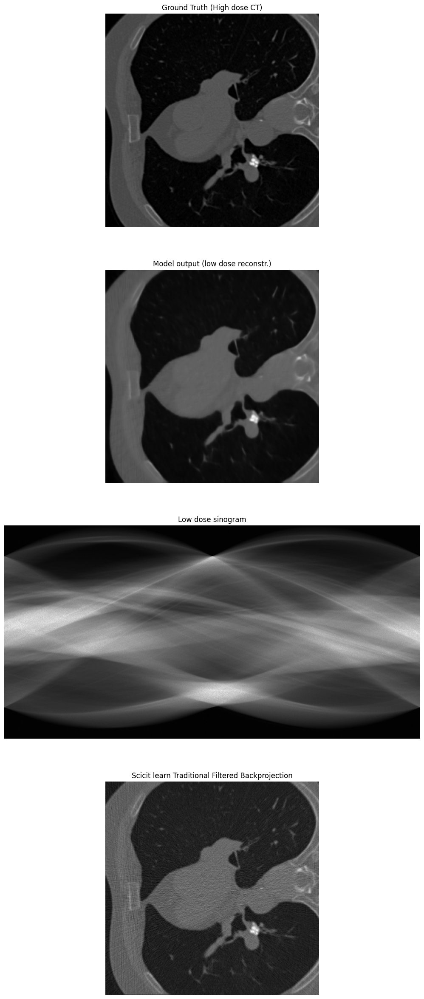

In [ ]:
out_tensor = inference_and_visualize(model,45, show_metrics=False)

1/1 [==============================] - 1s 855ms/step


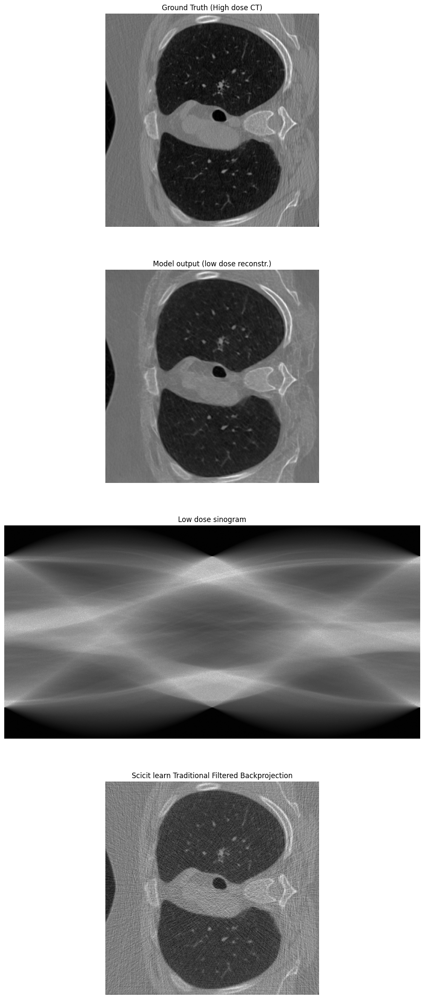

In [ ]:
out_tensor = inference_and_visualize(model,20, show_metrics=False)

In [ ]:
%load_ext tensorboard


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
LOG_DIR_TB

'logs/TensorBoard'

In [ ]:
!kill 1040164

In [ ]:
tensorboard --logdir='logs/TensorBoard'

Reusing TensorBoard on port 6006 (pid 1055451), started 2 days, 0:28:22 ago. (Use '!kill 1055451' to kill it.)

Found tensor tags: ['input_sinogram', 'predicted_image']

Processing tensor tag: input_sinogram
TYP OF THIS SHIT:  <class 'list'>
Tensor shape: (3,), dtype: object
b'513'
b'1000'
b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x02\x01\x00\x00\x03\xe8\x08\x00\x00\x00\x00b\xb1rC\x00\x00 \x00IDATx\x9c\xcc\xbd\xeb\xb6\xf4(\x8e\x05(9{\xe6\xfd\x9fw\xd6\xaa\xd0\xfc@\x97\xad\x0b\xd8\x8e\x13Y\xddT\xe5w\x1c6\x06\x01B\xda\x12\x023\xfd.\xfd\xbfRn\x08\x93\xb00\t\x11\xb1\xd0\xba \xd2_=w\xbdCL+\xdfz\xc2\xfa\x0f\xfb\xd3\x9eXX\x9f\xb1\xff\x0b\x05\x11\x13y\x0e"a\xf9\xe7\xc3t}h\x11\xea\xb4\x11}\x88\x88d\x11/\xa4\xaf\xfb\x05P\x8d\xbf\x05\xfe\xcd\x99Vo\xd4G,\xb9\x15\xbdE\xd0rL\xff\xdf\xd0\xf4/\xd3?\xbf+\xaa\x11*LB\xcc$\xcc\\\xdb\xc0\x9d\x01\xf0\xa1\x16\xc6\x96\xcf\xef\x18\x07\xd8\xf5\x8e\x08&\x16b\xe3\x00\x1b|b\xd1Ng\x16\x16b\xe1\xcf?$\xc4\xb4(\x14f\xe6\x0f+3(\xe3\x8a\xd3+$\\ke\xe7\x9c]7\x10\x89\x92\xdfY\x83\x0b\x13\x8c-"\xa6R\xc7\x7f\xfad\xf9:]?+\xa9\x17\xc5k\xe4\x84EHl\xec\xb4)SgD\x12\xfboj\xa8\x8f\xce\x98

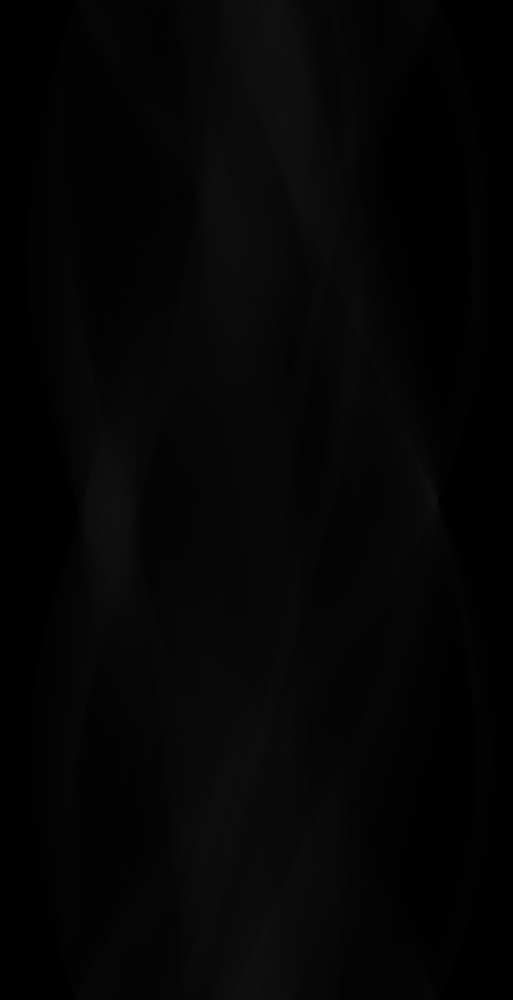


Processing tensor tag: predicted_image
TYP OF THIS SHIT:  <class 'list'>
Tensor shape: (3,), dtype: object
b'362'
b'362'
b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x01j\x00\x00\x01j\x08\x00\x00\x00\x00\x16\xb3O?\x00\x00 \x00IDATx\x9c\xac\xfd\xd7\xcee\xb9v j\xd2\xdb\xe9\x96\xfbMDd\xa4\xd1\x96\xaaT\xc29u\xd1h\xf4E\xbf\xffE\x03\x07h\xa0\x81\xd3R\x95\xb4\xf7N\x13\x11\xbf[fZz\xd3\x17G*\xb9-\x93\x19\xcd\x17\x98\xc4\x07\xaeEr\x90\x1c\x03~\xff\x97\x19\x82\r\x92\xa6\x04\x9f\x9b\xed\xf4\xb4_\xc8H\xc3\xfdmx\xfa\xee\x97\x8f\x7f\xf3\xe1\xaf\xe9O\xe0\xeb\xdb\xae\xd5\xb4\x0f\x15\x87*<Ir\x12\xb1s\x99D\x9c(I\xca\'6\xc9\xc4-\xafp\xdb\xaf\x8d\x1f.\xc3\xadP\x08\xd2b\xaa&-\xe0\x16\x00 \n@\x9e\x1am\xda\xcbpm\x00\xc6p\xe3^,2I\xba\x00\xe9pd\xd8\x0f?\xde\xaf\nT\x90\x1c/\x18\x82\xc8\xfc\xfeMy\x90\x91\x15zy8\xab\x15\x03iQ.\xbcZ\rA\x96c\x9f2501X\x95\xa7\x101G=\xa4\xae\x9fhH\x14Y\x9c\x8ay\xbf\xf4\xb1\xd2Mzn0lS-\x10\x92\xbc\xf9\xdf\x9b_\t@?\x8e\x98\xfd\x0e4\x8d\xe7\xa0\xf7M\x8dHm\xa9/\xfb\xa8\xcd\x81\xd9\xfe~=\

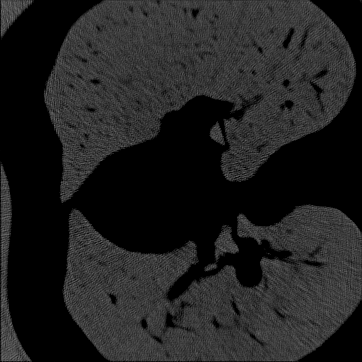

In [ ]:
from tensorboard.backend.event_processing import event_accumulator
from tensorboard.util import tensor_util  # Critical for decoding!
from PIL import Image
import io

# Path to your TensorBoard log directory
log_dir = "logs/TensorBoard/20250331-192809/im"

ea = event_accumulator.EventAccumulator(
    log_dir,
    size_guidance={
        event_accumulator.TENSORS: 0,  # Load all tensors
    }
)
ea.Reload()

# Step 3: List all tensor tags (debugging)
tensor_tags = ea.Tags().get("tensors", [])
print("Found tensor tags:", tensor_tags)

# Step 4: Extract and visualize tensors (assuming they are images)
for tag in tensor_tags:
    print(f"\nProcessing tensor tag: {tag}")
    tensor_events = ea.Tensors(tag)
    print("TYP OF THIS SHIT: ", type(tensor_events))
    for i, event in enumerate(tensor_events):
        # Convert TensorProto to numpy array
        # tensor = np.atleast_3d(event.tensor_proto.float_val)  # For float tensors
        # print(type(event.tensor_proto))

        tensor = tensor_util.make_ndarray(event.tensor_proto)
        
        # Debug: Print tensor shape/dtype
        print(f"Tensor shape: {tensor.shape}, dtype: {tensor.dtype}")
        print(tensor[0])
        print(tensor[1])
        print(tensor[2])

        height = int(tensor[0].decode('utf-8'))  # Convert b'513' to 513
        width = int(tensor[1].decode('utf-8'))   # Convert b'1000' to 1000
        png_data = tensor[2]                     # Get the PNG bytes

        # Create an image from the PNG bytes
        image = Image.open(io.BytesIO(png_data))

        # Verify the dimensions match what we expect
        print(f"Image size: {image.size}")  # Should be (1000, 513) - PIL uses (width, height)

        # If you need a numpy array
        image_array = np.array(image) / 255
        print(f"Array shape: {image_array.shape}")  # Should be (513, 1000, channels)

        # Display the image
        print("MAX: ", image_array.max())
        print("MIN: ", image_array.min())
        image.show()
        break
        # print(type(event.tensor_proto.string_val))
        
        # Alternative if tensor is stored as bytes:
        # # Handle shape (e.g., [H, W, C] or [C, H, W])
        # if tensor.ndim == 3:
        #     if tensor.shape[0] in [1, 3]:  # CHW format
        #         tensor = np.transpose(tensor, (1, 2, 0))  # Convert to HWC
        #     tensor = tensor.squeeze()  # Remove extra dims
        
        # # Normalize if needed (assuming 0-255 or 0-1 range)
        # if tensor.max() > 1.0:
        #     tensor = tensor / 255.0
        
        # Plot
        # plt.figure()
        # plt.imshow(tensor, cmap='gray' if tensor.shape[-1] == 1 else None)
        # plt.title(f"Tag: {tag}\nStep: {event.step}")
        # plt.axis('off')
        # plt.show()

In [ ]:
x = flattened
    for _ in range(fnn_layers):
        x = layers.Dense(fnn_units, activation='relu')(x)
    
# 3. Project back to spatial dimensions
# You can choose either:
# Option A: Direct pixel prediction (362x362x1)
# final_output = layers.Dense(362*362*1, activation='linear')(x)
# final_output = layers.Reshape((362, 362, 1))(final_output)

# Option B: Match Fourier feature dimensions (362x362x128)
final_output = layers.Dense(362*362*128, activation='linear')(x)
final_output = layers.Reshape((362, 362, 128))(final_output)

In [ ]:

base_path = "saved_models_march_27/"
files = os.listdir(base_path)
new_index = len(files) + 1
base_model_name = "FNN_ViT_CNN_All_files_2epochs"
model_name = base_model_name + str(new_index)
save_path = base_path + model_name + ".h5"
save_path

'saved_models_march_27/FNN_ViT_CNN_All_files_2epochs3.h5'

flow_from_directory function can do image loading easily if the images are individual

In [ ]:
save_path

'saved_models_march_27/FNN_ViT_CNN_All_files_2epochs3.h5'

In [ ]:
model.save(save_path)

/home/k/MASTERS/.venv_MI/lib/python3.10/site-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
model.history

In [ ]:
if hasattr(model, 'history') and model.history:
    print("Training history is available.")
    print("History keys:", model.history.history.keys())  # To check the available metrics in history
else:
    print("No training history found.")

Training history is available.
History keys: dict_keys([])


In [ ]:
import tensorflow.keras.backend as K
def variance_penalty_loss(y_true, y_pred):
    """ 
    Parabolic penalty function for a single image that penalizes both underestimation 
    and overestimation of variance in the predicted image.
    """
    # Compute variance for the entire image
    var_true = 1000*K.var(y_true)  # Variance of true image
    var_pred = 1000*K.var(y_pred)  # Variance of predicted image
    
    # Parabolic penalty: (var_pred - var_true)^2
    loss = K.square(var_true -var_pred)  
    
    return loss

In [ ]:
print(model_name)

image_domain_filter_UNET_almost_perfect7


In [ ]:
def edge_aware_loss(y_pred):
    # Compute Sobel gradients
    sobel_x = tf.image.sobel_edges(y_pred)[..., 0]  # Horizontal edges
    sobel_y = tf.image.sobel_edges(y_pred)[..., 1]  # Vertical edges
    gradient_magnitude = tf.sqrt(sobel_x**2 + sobel_y**2 + 1e-6)
    
    # Penalize images with weak edges (negative sign to maximize gradients)
    return -tf.reduce_mean(gradient_magnitude)

def variance_regularization_loss(y_pred):
    # Penalize low variance (flat images)
    spatial_variance = tf.math.reduce_variance(y_pred, axis=[1, 2, 3])
    return -tf.reduce_mean(spatial_variance)  # Negative sign to encourage variance

(362, 362)
1/1 [==============================] - 0s 358ms/step


IMG RESULT SHAPE (1, 362, 362, 1)
(362, 362)
(1, 362, 362, 1)
OUTPUT IMAGE SHAPE (1, 362, 362)
(1, 362, 362, 1)
PERCEPTUAL LOSS: 
inferred:  tf.Tensor(inf, shape=(), dtype=float32)
fbp reconstruction:  tf.Tensor(25.086355, shape=(), dtype=float32)
ALL BLACK:  tf.Tensor(25.102211, shape=(), dtype=float32)
SSIM LOSS: 


ValueError: in user code:

    File "/tmp/ipykernel_22877/75903496.py", line 105, in ssim_loss  *
        ssim_loss = 1 - tf.image.ssim(y_true, y_pred, max_val=1.0)

    ValueError: Shapes (362, 362, 1) and (1, 362, 362) are incompatible


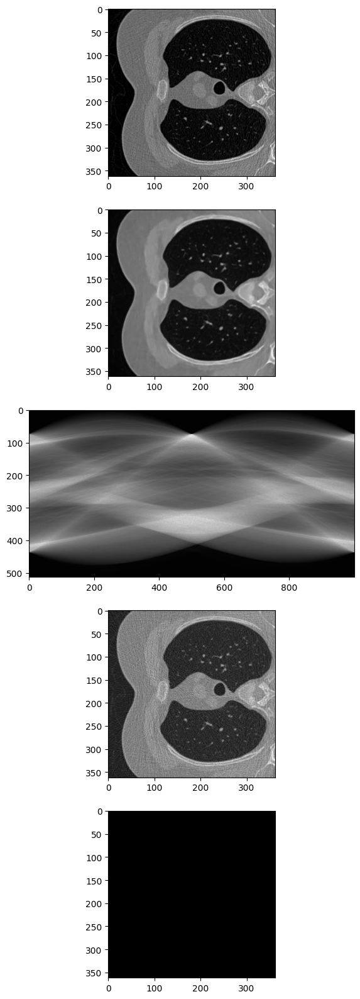

In [ ]:

im = 30
file_number = '000'
show_metrics = True
gttest_path = Path(base_path_win,f'gt_test/ground_truth_test_{file_number}.hdf5')
obtest_path = Path(base_path_win,f'observations_test/observation_test_{file_number}.hdf5')
file_gttest = h5py.File(gttest_path)
file_obtest = h5py.File(obtest_path)
data_gttest = file_gttest['data']
data_obtest = file_obtest['data']
img_obtest = data_obtest[im]

img_gttest = data_gttest[im][:][:]
print(img_gttest.shape)
img_array = np.expand_dims(img_obtest, axis=-1)  # Shape becomes (1000, 513, 1)

# Step 3: Normalize the image if needed (optional, depending on your model's training)
#img_array = img_array / 255.0  # Normalize the image data (if your model expects it)

# Step 4: Add batch dimension (1 image in a batch)
img_array = np.expand_dims(img_array, axis=0)
img_result = model.predict(img_array)
print("IMG RESULT SHAPE", img_result.shape)
img = np.squeeze(img_result)
print(img.shape)

theta = np.linspace(0, 180, 1000, endpoint=False)
# sinogram = radon(img_obtest, theta=theta)
rotated_sin = skimage.transform.rotate(img_obtest, 90, resize=True)

# Perform filtered back projection with a Hann filter
reconstruction_fbp = iradon(rotated_sin, theta=theta, filter_name='ramp', output_size=img_gttest.shape[0], circle=False)
reconstruction_fbp = skimage.transform.rotate(reconstruction_fbp, 90, resize=False)
black = tf.zeros((1, 362, 362, 1))
black_im = tf.squeeze(black)
fig, axs = plt.subplots(5, 1, figsize = (8, 20))
axs[0].imshow(img_gttest, cmap = 'grey')
axs[1].imshow(img, cmap = 'grey')
axs[2].imshow(rotated_sin, cmap = 'grey')
axs[3].imshow(reconstruction_fbp, cmap = 'grey')
axs[4].imshow(black_im, cmap = 'grey')
plt.savefig(f'reconstruct_results_newer/{model_name}.png', format='png')
if show_metrics:
    test_gt_exp = tf.expand_dims(img_gttest, -1)
    test_gt_exp = tf.expand_dims(test_gt_exp, 0)

    test_result = tf.expand_dims(img, 0)

    test_fbp = tf.expand_dims(reconstruction_fbp, 0)
    test_fbp = tf.expand_dims(test_fbp, -1)
    print(test_gt_exp.shape)
    print("OUTPUT IMAGE SHAPE", test_result.shape)
    print(test_fbp.shape)
    # test_gt_exp = tf.expand_dims(test_gt_exp, 1)
    print("PERCEPTUAL LOSS: ")
    print("inferred: ", perceptual_loss(test_gt_exp, img_result))
    print("fbp reconstruction: ",perceptual_loss(test_gt_exp, test_fbp))
    print("ALL BLACK: ",perceptual_loss(test_gt_exp, black))
    print("SSIM LOSS: ")
    print("inferred: ", ssim_loss(test_gt_exp, test_result))
    print("fbp reconstruction: ", ssim_loss(test_gt_exp, test_fbp))
    print("ALL BLACK: ", ssim_loss(test_gt_exp, black))
    print(" ")
    print("GRANDIENT LOSS: ")
    print("inferred: ",gradient_loss(test_gt_exp, test_result))
    print("fbp reconstruction: ",gradient_loss(test_gt_exp, test_fbp))
    print("ALL BLACK: ",gradient_loss(test_gt_exp, black))
    print(" ")
    print("MSE LOSS: ")
    print("inferred: ",tf.reduce_mean(tf.square(test_gt_exp - test_result)))
    print("fbp reconstruction: ",tf.reduce_mean(tf.square(test_gt_exp - test_fbp)))
    print("ALL BLACK: ",tf.reduce_mean(tf.square(test_gt_exp - black)))
    print(" ")
    print("MAE LOSS: ")
    print("inferred: ",tf.reduce_mean(test_gt_exp - test_result))
    print("fbp reconstruction: ",tf.reduce_mean(test_gt_exp - test_fbp))
    print("ALL BLACK: ",tf.reduce_mean(test_gt_exp - black))
    print(" ")
    print("PSNR LOSS: ")
    print("inferred: ",tf.image.psnr(test_gt_exp, test_result, 1))
    print("fbp reconstruction: ",tf.image.psnr(test_gt_exp, test_fbp, 1))
    print("ALL BLACK: ",tf.image.psnr(test_gt_exp, black, 1))
    print(" ")
    print("FOURIER LOSS: ")
    print("inferred: ", frequency_loss(test_gt_exp, test_result))
    print("fbp reconstruction: ", frequency_loss(test_gt_exp, test_fbp))
    print("ALL BLACK: ",frequency_loss(test_gt_exp, black))
    print(" ")
    print(tf.reduce_sum(test_gt_exp))
    print(tf.reduce_sum(test_fbp))
    print("EDGE AWARE LOSS")
    print("inferred: ",edge_aware_loss(test_gt_exp))
    print("fbp reconstruction: ",edge_aware_loss(test_fbp))
    print("ALL BLACK: ",edge_aware_loss(black))
    print("VARIANCE")
    print("inferred: ",variance_regularization_loss(test_gt_exp))
    print("fbp reconstruction: ",variance_regularization_loss(my_bp_image))
    print("ALL BLACK: ",variance_regularization_loss(black))
    print("Add the pixels")
    print("inferred: ",tf.reduce_sum(test_gt_exp))
    print("fbp reconstruction: ",tf.reduce_sum(my_bp_image))
    print("ALL BLACK: ",tf.reduce_sum(black))
    

In [ ]:
fig, axs = plt.subplots(3, 1, figsize = (3, 10))
axs[0].imshow(img_gttest, cmap = 'grey')
axs[1].imshow(img, cmap = 'grey')
axs[2].imshow(img_obtest, cmap = 'grey')


In [ ]:
print(my_bp_image.shape)
my_bp_image = tf.expand_dims(my_bp_image, 0)
bp_show = tf.squeeze(my_bp_image)

(1, 362, 362, 1)


VARIANCE
inferred:  tf.Tensor(-0.013211602, shape=(), dtype=float32)
fbp reconstruction:  tf.Tensor(-3.6913044e-09, shape=(), dtype=float32)
ALL BLACK:  tf.Tensor(-0.0, shape=(), dtype=float32)
Add the pixels
inferred:  tf.Tensor(18544.852, shape=(), dtype=float32)
fbp reconstruction:  tf.Tensor(20.78194, shape=(), dtype=float32)
ALL BLACK:  tf.Tensor(0.0, shape=(), dtype=float32)


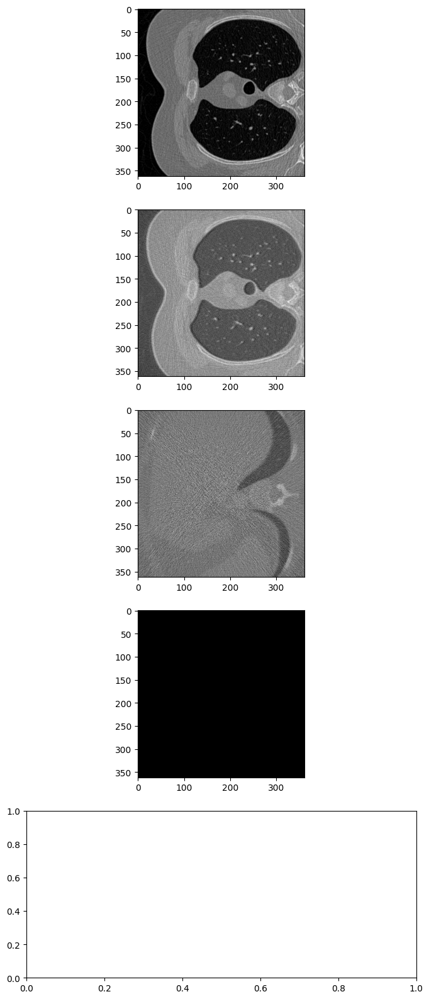

In [ ]:
print("VARIANCE")
print("inferred: ",variance_regularization_loss(test_gt_exp))
print("fbp reconstruction: ",variance_regularization_loss(my_bp_image))
print("ALL BLACK: ",variance_regularization_loss(black))
print("Add the pixels")
print("inferred: ",tf.reduce_sum(test_gt_exp))
print("fbp reconstruction: ",tf.reduce_sum(my_bp_image))
print("ALL BLACK: ",tf.reduce_sum(black))
fig, axs = plt.subplots(5, 1, figsize = (8, 20))
axs[0].imshow(img_gttest, cmap = 'grey')
axs[1].imshow(img, cmap = 'grey')
axs[2].imshow(bp_show, cmap = 'grey')
axs[3].imshow(black_im, cmap = 'grey')

In [ ]:
print(test_fbp)
print(tf.reduce_max(test_fbp))
print(tf.reduce_max(test_gt_exp))

tf.Tensor(
[[[[ 2.7323074e-06]
   [ 1.2241762e-05]
   [ 5.7993702e-06]
   ...
   [ 1.5842447e-04]
   [ 1.5291580e-04]
   [ 1.3815597e-04]]

  [[-2.9279338e-06]
   [ 5.7880679e-06]
   [ 8.8453726e-06]
   ...
   [ 1.6001266e-04]
   [ 1.5831567e-04]
   [ 1.3806132e-04]]

  [[-1.2190047e-06]
   [ 8.6126568e-07]
   [ 8.8552861e-06]
   ...
   [ 1.6431235e-04]
   [ 1.6483723e-04]
   [ 1.4326516e-04]]

  ...

  [[-3.6323895e-06]
   [ 5.1107017e-06]
   [ 3.5575565e-06]
   ...
   [ 1.4113476e-04]
   [ 1.4493038e-04]
   [ 1.3421031e-04]]

  [[ 1.0378655e-05]
   [ 1.3690782e-05]
   [ 8.2366196e-06]
   ...
   [ 1.4766869e-04]
   [ 1.4903277e-04]
   [ 1.3762429e-04]]

  [[ 1.7763679e-05]
   [ 1.7423054e-05]
   [ 1.0106114e-05]
   ...
   [ 1.2684183e-04]
   [ 1.2229534e-04]
   [ 1.1509073e-04]]]], shape=(1, 362, 362, 1), dtype=float32)
tf.Tensor(0.0003367274, shape=(), dtype=float32)
tf.Tensor(0.51956236, shape=(), dtype=float32)


In [ ]:
black = tf.zeros((1, 362, 362, 1))
black


<tf.Tensor: shape=(1, 362, 362, 1), dtype=float32, numpy=
array([[[[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [0.],
         [0.]],

        [[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [0.],
         [0.]],

        [[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [0.],
         [0.]],

        ...,

        [[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [0.],
         [0.]],

        [[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [0.],
         [0.]],

        [[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [0.],
         [0.]]]], dtype=float32)>

In [ ]:
tf.keras.backend.clear_session()